# House Price Prediction - Comprehensive Data Science Project
### —— Data Science Project for Exploratory Data Analysis (EDA), Statistical Inference, Feature Engineering, and Machine Learning.

#### Dataset downloaded from Kaggle
[<span style='color:#1f77b4'>**House Prices - Advanced Regression Techniques**</span>](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data)

### Life cycle of the Project:
- Understand the Problem
- Exploratory Data Analysis (Part 1)
  - whole picture of the data
  - univariate analysis

- <span style='color:blue'>**Exploratory Data Analysis (Part 2)**</span>
  - <span style='color:blue'>Variable Correlation/Dependency Analysis</span>
  - <span style='color:blue'>inferential statistics with hypothesis testing</span>

- Feature Engineering
- Feature Importance Analysis
- Machine Learning Model Building, evaluation, and deployment

# Exploratory Data Analysis Phase_Part 2
### Variable Correlation/Dependency Analysis, statistical inference with hypothesis testing


<a name="0"></a>
# Content Outline
- [4. Variable Correlation/Dependency Analysis](#4)
  - [4.0 Packages, Datasets, and Customized Functions Used in EDA Part 2](#4.0)
    - [Packages](#4.0.1)
    - [Version Information](#4.0.2)
    - [Datasets](#4.0.3)
    - [Customized Functions in EDA Part 2](#4.0.4)
  - [4.1 Numerical & Ordinal Categorical Variables](#4.1)
    - [4.1.1 continuous vs. continuous variables](#4.1.1)   
    - [4.1.2 continuous, discrete, and ordinal categorical variables](#4.1.2) 
    - [4.1.3 features highly correlated with 'log_SalePrice'](#4.1.3)
  - [4.2 Categorical vs. Continuous Numerical Variables](#4.2)
    - [4.2.1 independent t-test: compare two independent means](#4.2.1)      
    - [4.2.2 ANOVA: compare more than two independent means](#4.2.2)   
  - [4.3 Categorical vs. Categorical Variables](#4.3)
    - [4.3.1 independence test between 2-level categorical features](#4.3.1)   
    - [4.3.2 chi-square test of independence](#4.3.2)
- [EDA Part 2 summary](#5)


<a name="4"></a>
# 4. Variable Correlation/Dependency Analysis
- [4.0 Packages, Datasets, and Customized Functions Used in EDA Part 2](#4.0)
- [4.1 Numerical & Ordinal Categorical Variables](#4.1)
- [4.2 Categorical vs. Continuous Numerical Variables](#4.2)
- [4.3 Categorical vs. Categorical Variables](#4.3)


<a name="4.0"></a>
## 4.0 Packages, Datasets, and Customized Functions Used in EDA Part 2
- [Packages](#4.0.1)
- [Version Information](#4.0.2)
- [Datasets](#4.0.3)
- [Customized Functions in EDA Part 2](#4.0.4)

<a name="4.0.1"></a>
### Packages

In [ ]:
### install some packages as needed
# !pip install researchpy
# !pip install tabulate

In [43]:
###### import modules ####################################
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText # for text annotation in plt plots
import seaborn as sns
import re
import scipy.stats as stats # for QQ plot
import statsmodels.api as sm
from statsmodels.formula.api import ols # for ANOVA
from statsmodels.stats.proportion import proportions_ztest, proportions_chisquare
import researchpy as rp # for t-test and ANOVA
from tabulate import tabulate # for table printing
from sklearn.preprocessing import OrdinalEncoder

import session_info
import warnings
import inspect
import json

# sns.set_style('darkgrid')  ## set seabor style
warnings.filterwarnings('ignore') ## ignore warnings
pd.pandas.set_option('display.max_columns',None) ## Display all the columns of the dataframe

<a name="4.0.2"></a>
### version information for all imported modules
- use `session_info` to output version information for modules loaded in the current session, Python, the OS, and the CPU.
- version information is provided to increase reproducibility
- **note:** researchpy==0.3.5

In [3]:
session_info.show(std_lib=True, html=False)

-----
inspect             NA
io                  NA
json                2.0.9
matplotlib          3.6.2
numpy               1.23.4
pandas              1.5.1
re                  2.2.1
researchpy          NA
scipy               1.9.3
seaborn             0.12.1
session_info        1.0.0
sklearn             1.1.3
statsmodels         0.13.5
tabulate            0.9.0
warnings            NA
-----
IPython             8.6.0
jupyter_client      7.4.5
jupyter_core        5.0.0
jupyterlab          3.5.0
notebook            6.5.2
-----
Python 3.10.2 (tags/v3.10.2:a58ebcc, Jan 17 2022, 14:12:15) [MSC v.1929 64 bit (AMD64)]
Windows-10-10.0.22000-SP0
-----
Session information updated at 2022-11-14 07:54


<a name="4.0.3"></a>
### Read in Datasets and Dictionaries 
- already saved in EDA Part 1

In [4]:
###### read in datasets #########################
temp_df = pd.read_csv('EDA_files/EDA_redundant.csv')
EDA_df = pd.read_csv('EDA_files/EDA_essential.csv')

In [5]:
###### read in dictionaries #########################
dict_to_file_names = ['feat_type_dict.json', 'feat_type_dict_update.json', 'feat_type_dict_update_v2.json',
                      'cat_map_dict.json', 'cat_map_dict_bin.json', 'cat_map_dict_full.json']
dict_name_lst = [name.removesuffix('.json') for name in dict_to_file_names]

for i in range(len(dict_name_lst)):
    with open('EDA_files/' + dict_to_file_names[i], 'r') as f:
        globals()[dict_name_lst[i]] = json.load(f)

In [6]:
dict_name_lst

['feat_type_dict',
 'feat_type_dict_update',
 'feat_type_dict_update_v2',
 'cat_map_dict',
 'cat_map_dict_bin',
 'cat_map_dict_full']

<a name="4.0.4"></a>
### Customized Functions in EDA Part 2

In [7]:
### function that creates plot matrix to show feature vs target variable relationship
def plot_feat_target(df, feat_lst, target_var, kind, show_corr = False, draw_line = True, x_rotate_feat = None):
    """
    create plot matrix to show multiple feature vs. target 
    relationship and correlation coefficients in a data frame
    
    Params:
    --------
    df (pd.DataFrame)     : data frame
    feat_lst (list of str): feature names
    target_var (str)      : target variable name
    
    kind (str): plot type: {'regplot', 'violin', 'point_scatter', 'point_strip', 'kde'}, 
                'regplot'      : sns.regplot(), for continuous numerical features
                'violin'       : sns.violinplot(), for discrete numerical/categorical features
                'box_strip'    : sns.boxplot(), for discrete numerical/categorical feature
                'point_scatter': plt pointplot + scatterplot, for discrete numerical features
                'point_strip'  : sns.pointplot() + sns.stripplot(), for categorical features
                'kde'          : sns.kdeplot(), for categorical features
                
    show_corr (bool): show Pearson and/or Spearman correlation coefficients in plots,
                 only apply to 'regplot'/'point_scatter' plot type
                 
    draw_line (bool): if True, lines will be drawn between point estimates in sns.pointplot()
                 only apply to 'point_strip' plot type
    
    x_rotate_feat (list): a list of features for x label 90-degree rotation in plot,
                 apply to 'violin' / 'box_strip' / 'point_strip' plot type
    
    Returns:
    --------
    plt figure of plot matrix
    
    """
    if kind not in ['regplot', 'violin', 'box_strip', 'point_scatter', 'point_strip', 'kde']:
        print('Invalid plot type.')
        return
    
    if not set(feat_lst).issubset(set(df.columns)):
        print('One or more features are not in the data frame.')
        return
    
    if target_var not in df.columns:
        print('Target variable is not in the data frame.') 
        return
    
    if len(feat_lst) == 1:
        fig, axs = plt.subplots(1, 1, figsize = (6, 4))
        axs = [axs]  
    else: # more than 1 feature in the list
        fig_row_num = np.ceil(len(feat_lst)/2).astype(int)
        fig_width = 12
        fig_height = fig_row_num * 4
        fig, axs = plt.subplots(fig_row_num, 2, figsize = (fig_width, fig_height))
        axs = axs.flatten()
    
    if kind == 'regplot':
        for i, feature in enumerate(feat_lst):
            sns.regplot(x = feature, y = target_var, data = df, ci = None, ax = axs[i],
                        scatter_kws = {'alpha': 0.8, 'edgecolor': 'white'},
                        line_kws = {'color': '#ff7f0e', 'linewidth': 2})
            
            if show_corr:
                pearson_corr = df[feature].corr(df[target_var], method = 'pearson') # default method
                spearman_corr = df[feature].corr(df[target_var], method = 'spearman')
                text = '$\\rho$ = {:.2f}\nr = {:.2f}'.format(pearson_corr, spearman_corr)
                anchored_text = AnchoredText(text, loc = 'lower right', prop=dict(size=15), frameon=False)
                axs[i].add_artist(anchored_text)
    
    if kind == 'violin':
        for i, feature in enumerate(feat_lst):
            sns.violinplot(x = feature, y = target_var, data = df, ax = axs[i], bw=.5, palette='pastel')
            if x_rotate_feat is not None:
                degree = 90 if (feature in x_rotate_feat) else 0
                axs[i].tick_params(axis='x', rotation = degree)
    
    if kind == 'box_strip':
        for i, feature in enumerate(feat_lst):
            sns.boxplot(x = feature, y = target_var, data = df, ax = axs[i], palette='pastel')
            sns.stripplot(x = feature, y = target_var, hue = feature, data = df, alpha = 0.5, 
                          edgecolor = 'w', linewidth=0.3, ax = axs[i])
            axs[i].get_legend().remove()
            if x_rotate_feat is not None:
                degree = 90 if (feature in x_rotate_feat) else 0
                axs[i].tick_params(axis='x', rotation = degree)
       
    if kind == 'point_scatter':
        for i, feature in enumerate(feat_lst):
            mean_points = df.groupby(feature)[target_var].mean()
            plt.sca(axs[i])
            plt.scatter(x = feature, y = target_var, alpha = 0.3, data = df, edgecolor = 'white')
            if df[feature].dtype in ['int64', 'float64']:
                plt.xticks(np.arange(df[feature].min(), df[feature].max() + 1, 1))
            plt.plot(mean_points, marker = 'o', color = '#ff7f0e', markersize = 8)
            plt.xlabel(feature)
            plt.ylabel(target_var)
            
            if show_corr:
                spearman_corr = df[feature].corr(df[target_var], method = 'spearman')
                text = 'r = {:.2f}'.format(spearman_corr)
                anchored_text = AnchoredText(text, loc = 'upper center', prop=dict(size=15), frameon=False)
                axs[i].add_artist(anchored_text)
                
    if kind == 'point_strip':
        for i, feature in enumerate(feat_lst):
            sns.stripplot(x = feature, y = target_var, hue = feature, data = df, alpha = 0.9, edgecolor='white', 
                          linewidth=0.6, jitter = 0.3, palette = 'pastel', ax = axs[i], zorder=1) 
            sns.pointplot(x = feature, y = target_var, data = df, color = '#ff7f0e', 
                          ax = axs[i], join = draw_line)
            axs[i].get_legend().remove()
            if x_rotate_feat is not None:
                degree = 90 if (feature in x_rotate_feat) else 0
                axs[i].tick_params(axis='x', rotation = degree)
    
    if kind == 'kde':
        for i, feature in enumerate(feat_lst):
            if len(df[feature].unique()) > 15: # if too many categories
                sns.kdeplot(x = target_var, hue = feature, data = df, ax = axs[i], legend = False)
                text = '{}:\n\n    {} categories'.format(feature, len(df[feature].unique()))
                anchored_text = AnchoredText(text, loc = 'upper right', prop=dict(size=11), frameon=True)
                anchored_text.patch.set_linewidth(0.5)
                anchored_text.patch.set_edgecolor('gray')
                axs[i].add_artist(anchored_text)
            else:
                sns.kdeplot(x = target_var, hue = feature, data = df, ax = axs[i])
            if len(df[feature].unique()) == 2:
                counts = df[feature].value_counts()
                cat = df[feature].value_counts().index.tolist()
                text=('{}:\n    count = {}\n    $\\mu$ = {:.2f}\n    $\\sigma$ = {:.2f}\n\n' \
                      '{}:\n    count = {}\n    $\\mu$ = {:.2f}\n    $\\sigma$ = {:.2f}'
                      .format(cat[0], counts[cat[0]],
                              df[df[feature] == cat[0]][target_var].mean(), 
                              df[df[feature] == cat[0]][target_var].std(),
                              cat[1], counts[cat[1]],
                              df[df[feature] == cat[1]][target_var].mean(), 
                              df[df[feature] == cat[1]][target_var].std()))
            
                anchored_text = AnchoredText(text, loc = 'upper left', prop=dict(size=13), frameon=False)
                axs[i].add_artist(anchored_text)
    
    plt.tight_layout()
    
    return plt.show()


In [8]:
### function that visualizes correlation coefficients heatmap among features ##############
def create_corr_matrix(df, feat_lst, method, target_var = None, category_dict = None, 
                       only_plot = False, only_corr_df = False, annot = True, cbar=True):
    """
    create correlation coefficient matrix pd.DataFrame and/or plot correlation heatmap
    
    Params:
    --------
    df (pd.DataFrame): data frame
    
    feat_lst (list of str): feature names 
    
    method: correlation coefficient calculation method: {'pearson', 'spearman'}
    
    target_var: variable/feature shows in the left-most column of the matrix
    
    category_dict: a mapping dictionary of each feature with its ordered categories;
             need to be set if feat_lst includes ordinal features
             
    only_plot: if True, only return heatmap of correlation coefficient matix
    
    only_corr_df: if True, only return correlation coefficient matrix pd.DataFrame
    
    annot: if True, add annotation to heatmap
    
    cbar: if True, add color bar to heatmap
    
    
    Returns:
    --------
    feat_corr (pd.DataFrame): correlation coefficient matrix data frame,
             index, columns: feature names in feat_lst
      and/or
    
    plt figure: correlation matrix heatmap
    
    
    Notes:
    --------
    Set `category_dict = cat_map_dict_full` if feat_lst includes ordinal features.
    Dictionary `feat_type_dict` is used to check if feat_lst includes ordinal features that need encoding.
    All ordinal features need to be binned according to cat_map_dict_full before passing in the function.
    
    """       
    if method not in ['pearson', 'spearman']:
        print("Invalid method. Choose from {'pearson', 'spearman'}")
        return
    
    if target_var is not None:
        if target_var not in df.columns:
            print('Target variable is not in the data frame.')
            return
        if target_var in feat_lst:
            feat_lst.remove(target_var)
            feat_lst.insert(0, target_var)
        else:
            feat_lst = [target_var] + feat_lst
    
    if not set(feat_lst).issubset(set(df.columns)):
        print('One or more features in feat_lst are not in df.')  
        return
    
    data = df.copy()
    data = data.reset_index(drop=True)
    ord_feat_to_encode = [feat for feat in feat_type_dict['ordinal'] if feat not in ['OverallQual', 'OverallCond']]
    ord_feat_lst = [feat for feat in feat_lst if re.sub(r'.+_', '', feat) in ord_feat_to_encode]
    if len(ord_feat_lst) > 0: # if ordinal features exist in feat_lst
        if category_dict == None:
            print('category_dict is not available for ordinal encoding\nSet `category_dict = cat_map_dict_full`')
            return
        ord_feat_lst_noprefix = [re.sub(r'.+_', '', feat) for feat in ord_feat_lst]
        try: 
            cat_lst = [category_dict[feat] for feat in ord_feat_lst_noprefix]
        except KeyError as e:
            print('At least one feature is not in category_dict.keys()\n')
            print(repr(e))
            return
        
        try:
            ord_encoder  = OrdinalEncoder(categories = cat_lst)
            data[ord_feat_lst] = ord_encoder.fit_transform(data[ord_feat_lst])
        except Exception as e:
            print('OrdinalEncoder() does not work.\n')
            print(repr(e))
            return
    
    feat_corr = data[feat_lst].corr(method = method).round(3)
    
    if only_corr_df: # only get correlation matrix without heatmap
        return feat_corr
    
    plt.figure(figsize=(16, 15))
    mask = np.triu(np.ones_like(feat_corr, dtype=bool))
    sns.heatmap(feat_corr, mask=mask, vmin=-1, vmax=1, annot=annot, annot_kws={"fontsize": 9}, cbar=cbar,
                cbar_kws={'shrink': 0.3, 'pad': 0.01}, cmap = 'BrBG', linewidth=0.1)
    plt.title('{} Correlation Coefficient Matrix'.format(method), fontsize=14)
    plt.subplots_adjust(bottom=0.18)
    
    if only_plot: # only show heatmap without matrix dataframe
        return plt.show()
    else: # show both correlation dataframe and heatmap
        return feat_corr


In [9]:
### function that finds all features in a feature list that have correlation coefficients with target 
### variable more than a threshold
def high_corr_check(df, feat_lst, target_var, corr_thresh, category_dict = None):
    """
    find all features in feat_lst that have correlation coefficients with target_var 
    equal or more than a threshold
    
    Params:
    --------
    df (pd.DataFrame): data frame
    
    feat_lst (list of str): feature names
    
    target_var: variable/feature to check correlations with other features in feat_lst
    
    corr_thresh: correlation coefficient value threshold
    
    category_dict: a mapping dictionary of each feature with its ordered categories;
             need to be set if feat_lst includes ordinal features;
             same as `category_dict argument` in create_corr_matrix()    
    
    Returns:
    --------
    high_corr_feat_lst (list): a list of all features in feat_lst that meet the condition
    
      and
    
    high_corr_df (pd.DataFrame): correlation coefficient matrix data frame,
             index, columns: feature names in high_corr_feat_lst
             
    Notes:
    --------
    Need to call function create_corr_matrix().
    Set `category_dict = cat_map_dict_full` if feat_lst includes ordinal features.
    All ordinal features need to be binned according to cat_map_dict_full before passing in the function.
    
    """   
    if not set(feat_lst).issubset(set(df.columns)):
        print('One or more features are not in the data frame.')
        return
    
    if target_var not in df.columns:
        print('Target variable is not in the data frame.') 
        return
    
    feat_lst_noprefix = [re.sub(r'^[^hi].+_', '', feat) for feat in feat_lst]
    nom_feat_lst = [feat for i, feat in enumerate(feat_lst) if feat_lst_noprefix[i] 
                    in feat_type_dict_update_v2['nominal']]
    
    if len(nom_feat_lst) > 0:
        print(('Nominal feature(s) included in the feat_lst:\n{}\nRemove them from feat_lst before passing in.'
               .format(nom_feat_lst)))
        return
    
    ord_discrete_feat_lst = [feat for i, feat in enumerate(feat_lst) if feat_lst_noprefix[i] 
                             in feat_type_dict_update_v2['ordinal'] + feat_type_dict_update_v2['discrete']]
    
    method = 'spearman' if (len(ord_discrete_feat_lst) > 0) else 'pearson'
    corr_df = create_corr_matrix(df = df, feat_lst = feat_lst, target_var = target_var, method = method,
                                 category_dict = category_dict, only_corr_df = True)
    if corr_df is None:
        print('\nfunction create_corr_matrix() returns None.')
        return
    high_corr_feat_lst = corr_df.iloc[1:, 0][corr_df.iloc[1:, 0] >= corr_thresh].index.tolist()
    high_corr_df = corr_df.loc[[target_var] + high_corr_feat_lst, [target_var] + high_corr_feat_lst]
    
    return high_corr_feat_lst, high_corr_df


In [76]:
### function that creates histogram / qq-plot of target variable faceted by levels of one categorical feature ######
def plot_onecat_feat_target(df, feature, target_var, kind, title_adjust = 0.9):
    """
    create plot matrix to visualize target variable distribution
    faceted by levels of one categorical feature
    
    Params:
    --------
    df (pd.DataFrame): data frame
    feature (str)    : feature name
    target_var (str) : target variable name
    
    kind (str): plot type  : {'histogram', 'qqplot'}, 
                'histogram': sns.histogram(), histograms
                'qqplot'   : stats.probplot(), qq-plot
    
    title_adjust (float): parameter to pass in plt.subplots_adjust(top=title_adjust)
    
    Returns:
    --------
    plt figure of plot matrix
    
    """    
    if kind not in ['histogram', 'qqplot']:
        print('Invalid plot type.')
        return
    
    if feature not in df.columns:
        print('Feature `{}` is not in the data frame.'.format(feature))
        return
    
    if target_var not in df.columns:
        print('Target variable is not in the data frame.') 
        return
    
    if df[feature].dtype not in ['object', 'int64', 'category']:
        print('Feature `{}` is not a categorical feature.'.format(feature))
        return
    
    counts = df[feature].value_counts()
    cat_lst = df[feature].value_counts().index.tolist()
    fig_row_num = np.ceil(len(cat_lst)/2).astype(int)
    fig_width = 9
    fig_height = fig_row_num * 3.5
    fig, axs = plt.subplots(fig_row_num, 2, figsize = (fig_width, fig_height))
    axs = axs.flatten()
    
    if kind == 'histogram':
        for i, cat in enumerate(cat_lst):
            sns.histplot(x = target_var, data = df[df[feature] == cat], bins = 20, kde = True,
                         line_kws = {'color': '#ff7f0e', 'lw': 3, 'ls': '--'}, ax=axs[i])
            axs[i].set(ylabel = '')
            text=('{}:\n    count = {}\n    skewness = {:.2f}\n\n'
                  .format(cat, counts[cat], df[df[feature] == cat][target_var].skew()))
            anchored_text = AnchoredText(text, loc = 'upper left', prop=dict(size=12), frameon=False)
            axs[i].add_artist(anchored_text)
    
    if kind == 'qqplot':
        for i, cat in enumerate(cat_lst):
            stats.probplot(df[df[feature] == cat][target_var], plot = axs[i])
            text=('{}:\n    count = {}\n    skewness = {:.2f}\n\n'
                  .format(cat, counts[cat], df[df[feature] == cat][target_var].skew()))
            anchored_text = AnchoredText(text, loc = 'upper left', prop=dict(size=12), frameon=False)
            axs[i].add_artist(anchored_text)
    
    plt.suptitle('Feature `{}`'.format(feature), fontsize = 13)
    plt.subplots_adjust(top=title_adjust)
    plt.tight_layout()
            
    return plt.show()

In [11]:
### function that performs independent t-test for a 2-level categorical feature vs. a numerical feature
def ind_t_test(df, cat_feat, num_var, sig_level, return_typ = ['test_result', 'summary_stats'], interp = True):
    """
    perform independent t-test for a 2-level categorical 
    feature vs. a numerical feature, and return multiple types of results / summary
    
    Params:
    --------
    df (pd.DataFrame): data frame
    cat_feat (str)   : 2-level categorical feature name
    num_var (str)    : numerical variable name
    sig_level (float): significance level for t-test
    return_typ       : None, {'test_result', 'summary_stats'}
                       set return value type(s):
                       if None, only show result interpretation
                       if str, return only one item; 
                       if list, return both items in the dictionary, as a tuple
    interp (bool)    : if True, show t-test result interpretation
    
    
    Returns:
    --------
    if return_typ is not None, return one or both of the followings:
        test_result (pd.DataFrame)  : t-test results data frame
        summary_stats (pd.DataFrame): summary statistics data frame
    
    """    
    if return_typ is not None:
        return_typ_lst = [return_typ] if type(return_typ) == str else return_typ
        if not set(return_typ_lst).issubset(set(['test_result', 'summary_stats'])):
            print("Invalid return type. Choose from {'test_result', 'summary_stats'}")
            return
    
    if cat_feat not in df.columns:
        print('Feature `{}` is not in the data frame.'.format(cat_feat))
        return
    
    if num_var not in df.columns:
        print('Variable `{}` is not in the data frame.'.format(num_var)) 
        return
    
    if df[cat_feat].dtype not in ['object', 'int64', 'category']:
        print('Feature `{}` is not a categorical feature.'.format(cat_feat))
        return
    
    if df[num_var].dtype not in ['float64', 'int64']:
        print('Variable `{}` is not a numerical variable.'.format(num_var))
        return
    
    cat_lst = list(df[cat_feat].unique())
    if len(cat_lst) > 2:
        print('Feature `{}` has more than two categories.'.format(cat_feat))
        return
    
    summary, results = rp.ttest(group1 = EDA_df[EDA_df[cat_feat] == cat_lst[0]][num_var], group1_name = cat_lst[0],
                                group2 = EDA_df[EDA_df[cat_feat] == cat_lst[1]][num_var], group2_name = cat_lst[1])
    
    if interp or (return_typ is None): # if (only) show result interpretation
        t_stat, p_value = results['results'][2], results['results'][3]
        print('Independent t-test :\nCategorical Feature: {}\nNumerical Variable : {}'.format(cat_feat, num_var))
        print('-' * 30 + '\n')
        if p_value < sig_level:
            print(('(t-statistic, p_value) = ({:.3f}, {:.3f}), significance level = {}\n\nThere *EXISTS* a ' \
                   'statistically significant difference\nin the average `{}` between two groups of `{}`.\n'
                   .format(t_stat, p_value, sig_level, num_var, cat_feat)))

            if results['results'][4] < sig_level:
                print('The average `{}` in group `{}` is statistically significantly\n*higher* than that in ' \
                      'group `{}`.\n'.format(num_var, cat_lst[1], cat_lst[0]))

            if results['results'][5] < sig_level:
                print('The average `{}` in group `{}` is statistically significantly\n*higher* than that in ' \
                      'group `{}`.\n'.format(num_var, cat_lst[0], cat_lst[1]))
            print('=' * 80 + '\n')
        else: # p_value >= sig_level
            print(('(t-statistic, p_value) = ({:.3f}, {:.3f}), significance level = {}\n\nThere is *NO* ' \
                   'statistically significant difference\nin the average `{}` between two groups of `{}`.\n'
                   .format(t_stat, p_value, sig_level, num_var, cat_feat)))
            print('=' * 80 + '\n')
    
    if return_typ is None:
        return
    
    return_typ_dict = {'summary_stats': summary, 'test_result': results}
    if type(return_typ) == str:
        return return_typ_dict[return_typ]
    else:
        return return_typ_dict[return_typ[0]], return_typ_dict[return_typ[1]]
       

In [12]:
### function that finds all 2-level categorical features in a feature list that show significant between-group
### mean difference for a continuous variable
def ind_ttest_diff_check(df, cat_feat_lst, num_var, sig_level, all_feat = False):
    """
    find all 2-level categorical features in a feature list that show significant between-group
    mean difference for a continuous variable
    
    Params:
    --------
    df (pd.DataFrame)         : data frame
    cat_feat_lst (list of str): 2-level categorical feature list
    num_var (str)             : numerical variable name
    sig_level (float)         : significance level for t-test
    all_feat (bool)           : if True, returned results include all features in cat_feat_lst
    
    Returns:
    --------
    result_feat_lst (list): a list of all features in cat_feat_lst that meet the condition
    
      and
    
    t_test_df (pd.DataFrame): t-test results data frame,
             index  : feature names in result_feat_lst
             columns: 't_statistic', 'p_value'        
    Notes:
    --------
    Need to call function ind_t_test().
    
    """
    result_feat_lst, t_stat_lst, p_value_lst = [], [], []
    for feat in cat_feat_lst:
        results = ind_t_test(df = df, cat_feat = feat, num_var = num_var, 
                             sig_level = sig_level, return_typ = 'test_result', interp = False)
        if results is None:
            print('\nfunction ind_t_test() returns None.')
            return
        
        if all_feat:
            result_feat_lst.append(feat)
            t_stat_lst.append(results['results'][2])
            p_value_lst.append(results['results'][3])
        else: # if only keep features with p_value < sig_level
            if results['results'][3] < sig_level:
                result_feat_lst.append(feat)
                t_stat_lst.append(results['results'][2])
                p_value_lst.append(results['results'][3])
    
    if len(result_feat_lst) == 0:
        print('There is *NO* statistically significant difference in the average `{}` between ' \
              'two groups of any feature in feat_lst'.format(num_var))
        return
    
    t_test_df = pd.DataFrame({'t_statistic': t_stat_lst, 'p_value': p_value_lst}, index = result_feat_lst)
    
    return result_feat_lst, t_test_df


In [13]:
### function that performs ANOVA for a multi-level (> 2) categorical feature vs. a numerical feature
def anova_test(df, cat_feat, num_var, sig_level, return_typ = ['summary_stats', 'aov_table'], interp = True):
    """
    perform ANOVA for a multi-level (> 2) categorical 
    feature vs. a numerical feature, and return multiple types of results / summary
    
    Params:
    --------
    df (pd.DataFrame): data frame
    cat_feat (str)   : multi-level categorical feature name
    num_var (str)    : numerical variable name
    sig_level (float): significance level for ANOVA
    return_typ       : None, {'ols_reg_result', 'summary_stats', 'aov_table'}
                       set return value type(s):
                       if None, only show result interpretation
                       if str, return only one item; 
                       if list, return two or all items in the dictionary, as a tuple
    interp (bool)    : if True, show ANOVA result interpretation
    
    
    Returns:
    --------
    if return_typ is not None, return one or more of the followings:
        ols_reg_result (statsmodels.iolib.summary.Summary object)  : ols regression result 
        summary_stats (pd.DataFrame): summary statistics data frame
        aov_table (pd.DataFrame)    : ANOVA test result
    
    """      
    if return_typ is not None:
        return_typ_lst = [return_typ] if type(return_typ) == str else return_typ
        if not set(return_typ_lst).issubset(set(['ols_reg_result', 'summary_stats', 'aov_table'])):
            print("Invalid return type. Choose from {'ols_reg_result', 'summary_stats', 'aov_table'}")
            return
    
    if cat_feat not in df.columns:
        print('Feature `{}` is not in the data frame.'.format(cat_feat))
        return
    
    if num_var not in df.columns:
        print('Variable `{}` is not in the data frame.'.format(num_var)) 
        return
    
    if df[cat_feat].dtype not in ['object', 'int64', 'category']:
        print('Feature `{}` is not a categorical feature.'.format(cat_feat))
        return
    
    if df[num_var].dtype not in ['float64', 'int64']:
        print('Variable `{}` is not a numerical variable.'.format(num_var))
        return
    
    cat_lst = list(df[cat_feat].unique())
    if len(cat_lst) < 3:
        print('Feature `{}` has less than 3 categories. Use t-test instead.'.format(cat_feat))
        return
    
    model_str = '{} ~ C({})'.format(num_var, cat_feat)
    model = ols(model_str, data = df).fit()
    aov_table = sm.stats.anova_lm(model, typ = 2)
    
    if interp or (return_typ is None): # if (only) show result interpretation
        f_statistic, p_value = aov_table.F[0], aov_table.iloc[0, -1]
        print('ANOVA:\nCategorical Feature: {}\nNumerical Variable : {}'.format(cat_feat, num_var))
        print('-' * 30 + '\n')
        print(('(F-statistic, p_value) = ({:.3f}, {:.3f}), significance level = {}\n'
               .format(f_statistic, p_value, sig_level)))
        
        if p_value < sig_level:
            print('There *EXISTS* a statistically significant difference\nin the average `{}` between groups ' \
                  'of `{}`:\n\nAmong all groups of `{}`, at least one pair of\n`{}` means are different from ' \
                  'each other.\n'.format(num_var, cat_feat, cat_feat, num_var))
            print('=' * 80 + '\n')
        else: # p_value >= sig_level
            print('There is *NO* statistically significant difference\nin the average `{}` between groups ' \
                  'of `{}`.\n'.format(num_var, cat_feat))
            print('=' * 80 + '\n')
    
    if return_typ is None:
        return
    
    return_typ_dict = dict()
    if 'aov_table' in return_typ_lst:
        return_typ_dict['aov_table'] = aov_table
    if 'ols_reg_result' in return_typ_lst:
        ols_result = model.summary() # ols regression results
        return_typ_dict['ols_reg_result'] = ols_result
    if 'summary_stats' in return_typ_lst:
        df_overall = rp.summary_cont(df[num_var])
        df_groups = rp.summary_cont(df.groupby(cat_feat)[num_var])
        summary = pd.concat([df_groups, pd.DataFrame(df_overall.iloc[0, 1:].rename('Overall')).T])
        return_typ_dict['summary_stats'] = summary
    
    if type(return_typ) == str:
        return return_typ_dict[return_typ]
    else:
        return_vals = tuple([return_typ_dict[typ] for typ in return_typ])
        return return_vals


In [14]:
### function that performs independence test between 2-level categorical features
def cat2lev_ind_test(df, feat_1, feat_2, sig_level, return_typ = ['z_test_res', 'chi2_test_res', 'fisher_test_res'], 
                     interp = True):
    """
    performs independence test between 2-level categorical features:
        two independent proportion z-test,
        proportion Chi-square test,
        Fisher' Exact test,
    and return multiple types of results / summary
    
    Params:
    --------
    df (pd.DataFrame): data frame
    feat_1 (str)     : 2-level categorical feature name
    feat_2 (str)     : 2-level categorical feature name, different from feat_1
    sig_level (float): significance level for hypothesis testing
    return_typ       : None, {'crosstab', 'z_test_res', 'chi2_test_res', 'fisher_test_res', 'res_sum', 'exp_count_tab'}
                       set return value type(s):
                       if None, only show result interpretation
                       if str, return only one item; 
                       if list, return two or all items in the dictionary, as a tuple
    interp (bool)    : if True, show independence test result interpretation
    
    
    Returns:
    --------
    if return_typ is not None, return one or more of the followings:
        crosstab (pd.DataFrame)       : crosstabulation/contingency table for cell counts
        z_test_res (tuple)            : (z-statistic, p_value) pair
        chi2_test_res (tuple)         : (Chi-square statistic, p_value) pair
        fisher_test_res (pd.DataFrame): Fisher's Exact test result data frame
        res_sum (pd.DataFrame)        : result summary data frame of all tests and their corresponding 
                                        calculation method
        exp_count_tab (pd.DataFrame)  : expected cell counts table, useful when checking test conditions
        
    """      
    if return_typ is not None:
        return_typ_lst = [return_typ] if type(return_typ) == str else return_typ
        if not set(return_typ_lst).issubset(set(['crosstab', 'z_test_res', 'chi2_test_res',
                                                 'fisher_test_res', 'res_sum', 'exp_count_tab'])):
            print("Invalid return type. Choose from:\n" \
                  "{'crosstab', 'z_test_res', 'chi2_test_res', 'fisher_test_res', 'res_sum', 'exp_count_tab'}")
            return
    
    if feat_1 not in df.columns:
        print('Feature `{}` is not in the data frame.'.format(feat_1))
        return
    
    if feat_2 not in df.columns:
        print('Feature `{}` is not in the data frame.'.format(feat_2)) 
        return
    
    cat_lst_1, cat_lst_2 = list(df[feat_1].unique()), list(df[feat_2].unique())
    if len(cat_lst_1) > 2:
        print('Feature `{}` has more than two categories.'.format(feat_1))
        return
    
    if len(cat_lst_2) > 2:
        print('Feature `{}` has more than two categories.'.format(feat_2))
        return
    
    crosstab, fisher_test_res, exp_count_tab = rp.crosstab(df[feat_1], df[feat_2], test='fisher', 
                                                           expected_freqs = True)
    z_test_res = proportions_ztest(count=crosstab.iloc[:2, 0], nobs=crosstab.iloc[:2, 2], alternative='two-sided')
    chi2_test_res = proportions_chisquare(count=crosstab.iloc[:2, 0], nobs=crosstab.iloc[:2, 2])[:2]
    
    z_stat, p_val_z = z_test_res
    chi2_stat, p_val_chi2 = chi2_test_res
    p_val_fisher = fisher_test_res.iloc[1, 1]
    res_df= pd.DataFrame({'test_statistic': [z_stat, chi2_stat, np.nan], 
                          'p_value': [p_val_z, p_val_chi2, p_val_fisher], 
                          'cal_function': ['proportions_ztest()', 'proportions_chisquare()', 'crosstab()'],
                          'module': ['statsmodels.stats.proportion', 'statsmodels.stats.proportion', 'researchpy']},
                         index = ['z-test', 'Chi-square test', 'Fisher’s Exact test'])
    
    if interp or (return_typ is None): # if (only) show result interpretation        
        print(('Independence test between 2-level categorical features:\nFeature 1: {}\nFeature 2: {}'
               .format(feat_1, feat_2)))
        print('-' * 30 + '\n')
        print('Test Result Summary:')
        print('-' * 20 + '\n')
        print(tabulate(res_df.round(4).fillna(''), headers = res_df.columns))
        print('-' * 100 + '\n')
        print('z-test assumption check:')
        print(('According to crosstab (contingency table), the sample size condition for\n' \
               'two independent proportion z-test is *{t1}*:\n*{t2}* cells have at least 10 cases.\n'
               .format(t1='NOT SATISFIED' if np.any(crosstab.values < 10) else 'SATISFIED', 
                       t2='NOT ALL' if np.any(crosstab.values < 10) else 'ALL')))
        
        if p_val_z < sig_level:
            print('According to p_value from z-test result, There *EXISTS* a relationship between\n`{}` and `{}` ' \
                  'distribution with significance level {}.\n\nThe two categorical features are *DEPENDENT* of ' \
                  'each other.'. format(feat_1, feat_2, sig_level))
            print('=' * 100 + '\n')
        else: # p_value >= sig_level
            print('According to p_value from z-test result, There is *NO* relationship between\n`{}` and `{}` ' \
                  'distribution with significance level {}.\n\nThe two categorical features are *INDEPENDENT* of ' \
                  'each other.'. format(feat_1, feat_2, sig_level))
            print('=' * 100 + '\n')
        
    if return_typ is None:
        return
        
    return_typ_dict = {'crosstab': crosstab, 'z_test_res': z_test_res, 'chi2_test_res': chi2_test_res, 
                       'fisher_test_res': fisher_test_res, 'res_sum': res_df, 'exp_count_tab': exp_count_tab}
    
    if type(return_typ) == str:
        return return_typ_dict[return_typ]
    else:
        return_vals = tuple([return_typ_dict[typ] for typ in return_typ])
        return return_vals
 

In [15]:
### function that performs Chi-square test of independence between multi-level categorical features ###############

def chi2_test(df, feat_1, feat_2, sig_level, return_typ = ['crosstab', 'test_res'], interp = True):
    """
    performs Chi-square test of independence between multi-level categorical features
    (at least one with more than 2 levels),and return multiple types of results / summary
    
    Params:
    --------
    df (pd.DataFrame): data frame
    feat_1 (str)     : multi-level categorical feature name
    feat_2 (str)     : multi-level categorical feature name, different from feat_1
    sig_level (float): significance level for Chi-square test
    return_typ       : None, {'crosstab', 'test_res', 'exp_count_tab'}
                       set return value type(s):
                       if None, only show result interpretation
                       if str, return only one item; 
                       if list, return two or all items in the dictionary, as a tuple
    interp (bool)    : if True, show Chi-square test result interpretation
    
    
    Returns:
    --------
    if return_typ is not None, return one or more of the followings:
        crosstab (pd.DataFrame)     : crosstabulation/contingency table for cell counts
        test_res (pd.DataFrame)     : test result data frame
        exp_count_tab (pd.DataFrame): expected cell counts table, useful when checking test conditions
        
    """ 
    if return_typ is not None:
        return_typ_lst = [return_typ] if type(return_typ) == str else return_typ
        if not set(return_typ_lst).issubset(set(['crosstab', 'test_res', 'exp_count_tab'])):
            print("Invalid return type. Choose from:\n" \
                  "{'crosstab', 'test_res', 'exp_count_tab'}")
            return
    
    if feat_1 not in df.columns:
        print('Feature `{}` is not in the data frame.'.format(feat_1))
        return
    
    if feat_2 not in df.columns:
        print('Feature `{}` is not in the data frame.'.format(feat_2)) 
        return
    
    cat_dtype = ['object', 'int64', 'category']
    if (df[feat_1].dtype not in cat_dtype) or (df[feat_2].dtype not in cat_dtype):
        print('At least one feature is not a categorical feature.')
        return
    
    cat_lst_1, cat_lst_2 = list(df[feat_1].unique()), list(df[feat_2].unique())
    if len(cat_lst_1) < 3 and len(cat_lst_2) < 3:
        print('Both features have 2 levels (At least one feature should have more than two categories).')
        return
    
    crosstab_pd = pd.crosstab(df[feat_1], df[feat_2])
    res_stats = stats.chi2_contingency(crosstab_pd)
    d_freedom = res_stats[2]
    
    crosstab, test_res, exp_count_tab = rp.crosstab(df[feat_1], df[feat_2], test = "chi-square", 
                                                    expected_freqs = True)
    
    if interp or (return_typ is None): # if (only) show result interpretation
        chi2_statistic, p_val = test_res.iloc[0, 1], test_res.iloc[1, 1]
        print(('Chi-square independence test between multi-level categorical features:\nFeature 1: {}\nFeature 2: {}'
               .format(feat_1, feat_2)))
        print('-' * 30 + '\n')
        print(('(Chi-square statistic, p_value, degree_freedom) = ({:.3f}, {:.3f}, {}),\nsignificance level = {}\n'
               .format(chi2_statistic, p_val, d_freedom, sig_level)))
        print('Chi-square test assumption check:')
        print(('According to expected cell counts table, the sample size condition for\n' \
               'Chi-square test is *{t1}*:\n*{t2}* cells have at least 5 *expected* cases.\n'
               .format(t1='NOT SATISFIED' if np.any(exp_count_tab.values < 5) else 'SATISFIED', 
                       t2='NOT ALL' if np.any(exp_count_tab.values < 5) else 'ALL')))
        
        if p_val < sig_level:
            print('According to p_value from test result, There *EXISTS* a relationship between\n`{}` and `{}` ' \
                  'distribution with significance level {}.\n\nThe two categorical features are *DEPENDENT* of ' \
                  'each other.'. format(feat_1, feat_2, sig_level))
            print('=' * 80 + '\n')
        else: # p_value >= sig_level
            print('According to p_value from test result, There is *NO* relationship between\n`{}` and `{}` ' \
                  'distribution with significance level {}.\n\nThe two categorical features are *INDEPENDENT* of ' \
                  'each other.'. format(feat_1, feat_2, sig_level))
            print('=' * 80 + '\n')
    
    if return_typ is None:
        return
        
    return_typ_dict = {'crosstab': crosstab, 'test_res': test_res, 'exp_count_tab': exp_count_tab}
    
    if type(return_typ) == str:
        return return_typ_dict[return_typ]
    else:
        return_vals = tuple([return_typ_dict[typ] for typ in return_typ])
        return return_vals


In [16]:
###### check function docstring ###################################
print(inspect.getdoc(anova_test)) # or press shift + tab after typing in function name

perform ANOVA for a multi-level (> 2) categorical 
feature vs. a numerical feature, and return multiple types of results / summary

Params:
--------
df (pd.DataFrame): data frame
cat_feat (str)   : multi-level categorical feature name
num_var (str)    : numerical variable name
sig_level (float): significance level for ANOVA
return_typ       : None, {'ols_reg_result', 'summary_stats', 'aov_table'}
                   set return value type(s):
                   if None, only show result interpretation
                   if str, return only one item; 
                   if list, return two or all items in the dictionary, as a tuple
interp (bool)    : if True, show ANOVA result interpretation


Returns:
--------
if return_typ is not None, return one or more of the followings:
    ols_reg_result (statsmodels.iolib.summary.Summary object)  : ols regression result 
    summary_stats (pd.DataFrame): summary statistics data frame
    aov_table (pd.DataFrame)    : ANOVA test result


*back to [content outline](#0)*

<a name="4.1"></a>
## 4.1 Numerical & Ordinal Categorical Variables
#### evaluate correlation coefficients
- [4.1.1 continuous vs. continuous variables](#4.1.1)   
  pearson & spearman correlation coefficient visualization
- [4.1.2 continuous, discrete, and ordinal categorical variables](#4.1.2)   
  spearman correlation coefficient visualization


<a name="4.1.1"></a>
## 4.1.1 continuous vs. continuous variables
- continuous numerical vairables and year-related variables
- pearson & spearman correlation coefficient analysis

,log_SalePrice,log_LotFrontage,log_LotArea,log_MasVnrArea,BsmtFinSF1,log_BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,log_1stFlrSF,2ndFlrSF,LowQualFinSF,log_GrLivArea,GarageArea,log_WoodDeckSF,log_OpenPorchSF,EnclosedPorch,3SsnPorch,log_ScreenPorch,log_PoolArea,log_MiscVal,log_TotalLivArea,log_TotalFlrSF,log_TotalPorchSF,AgebySale,GarageAge,RemodAge
log_SalePrice,1.000,0.359,0.400,0.416,0.383,-0.029,0.223,0.642,0.611,0.307,-0.038,0.733,0.655,0.341,0.461,-0.149,0.056,0.108,0.041,-0.067,0.743,0.815,0.310,-0.590,-0.572,-0.571
log_LotFrontage,0.359,1.000,0.678,0.131,0.143,0.054,0.136,0.316,0.426,0.032,0.021,0.318,0.317,0.052,0.119,0.019,0.068,0.051,0.050,0.037,0.322,0.374,0.110,-0.083,-0.063,-0.056
log_LotArea,0.400,0.678,1.000,0.061,0.202,0.087,0.077,0.330,0.455,0.066,0.014,0.372,0.310,0.117,0.130,0.013,0.057,0.090,0.060,0.082,0.394,0.413,0.136,-0.016,-0.022,-0.023
log_MasVnrArea,0.416,0.131,0.061,1.000,0.248,-0.060,0.112,0.352,0.322,0.058,-0.097,0.297,0.364,0.160,0.204,-0.150,0.043,0.040,-0.003,-0.053,0.344,0.375,0.073,-0.406,-0.338,-0.219
BsmtFinSF1,0.383,0.143,0.202,0.248,1.000,-0.006,-0.526,0.460,0.378,-0.183,-0.067,0.117,0.269,0.163,0.092,-0.103,0.030,0.078,0.022,-0.000,0.656,0.319,0.008,-0.247,-0.179,-0.121
log_BsmtFinSF2,-0.029,0.054,0.087,-0.060,-0.006,1.000,-0.240,0.079,0.075,-0.100,0.015,-0.040,-0.016,0.060,-0.077,0.056,-0.018,0.064,0.088,0.028,0.179,0.024,-0.045,0.069,0.079,0.104
BsmtUnfSF,0.223,0.136,0.077,0.112,-0.526,-0.240,1.000,0.442,0.322,0.003,0.028,0.271,0.185,0.027,0.190,-0.002,0.021,-0.021,-0.034,-0.056,-0.182,0.406,0.176,-0.150,-0.177,-0.184
TotalBsmtSF,0.642,0.316,0.330,0.352,0.460,0.079,0.442,1.000,0.782,-0.227,-0.033,0.410,0.472,0.217,0.284,-0.096,0.042,0.092,0.009,-0.065,0.564,0.791,0.192,-0.400,-0.352,-0.296
log_1stFlrSF,0.611,0.426,0.455,0.322,0.378,0.075,0.322,0.782,1.000,-0.248,-0.011,0.531,0.474,0.194,0.237,-0.069,0.062,0.107,0.037,-0.041,0.603,0.741,0.167,-0.273,-0.258,-0.231
2ndFlrSF,0.307,0.032,0.066,0.058,-0.183,-0.100,0.003,-0.227,-0.248,1.000,0.065,0.655,0.125,0.080,0.218,0.066,-0.024,0.021,0.044,0.000,0.351,0.325,0.214,-0.004,-0.055,-0.138


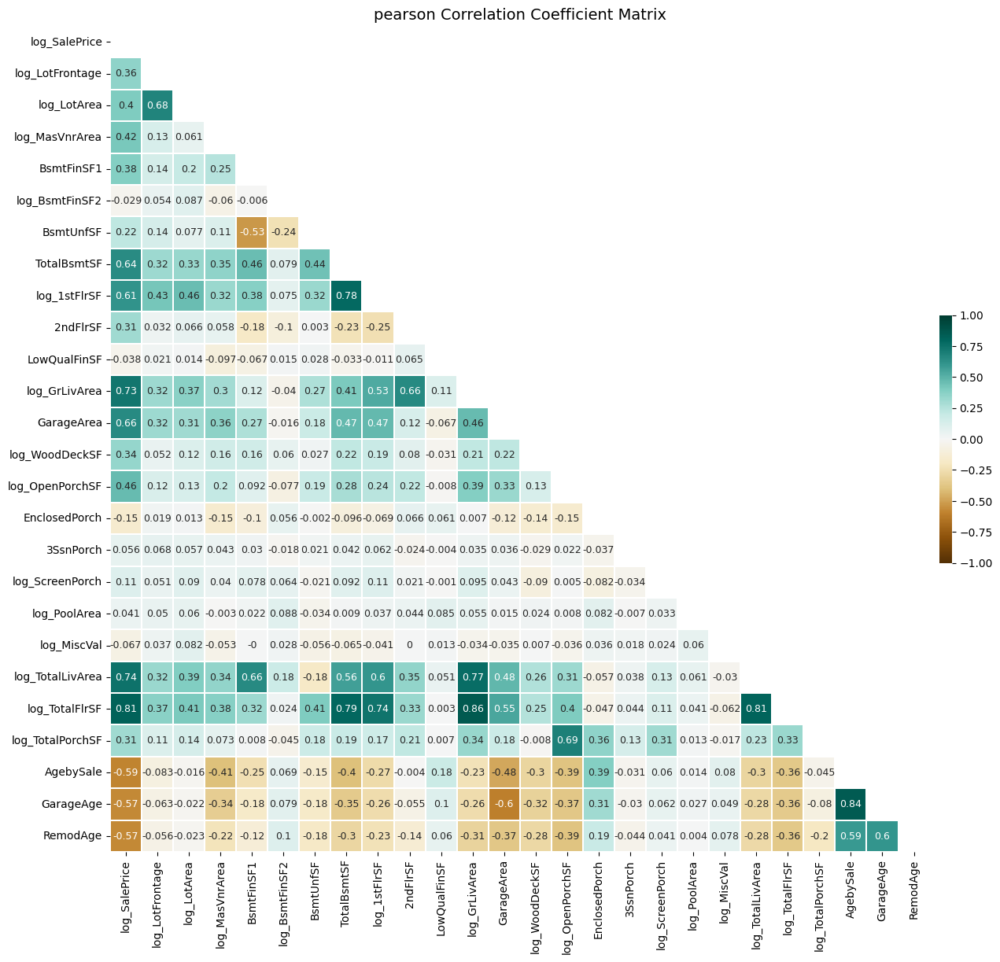

In [17]:
###### pearson correlation coefficient matix ##########################################
create_corr_matrix(df=EDA_df, feat_lst = feat_type_dict_update['continuous'] + feat_type_dict_update['year'], 
                   method = 'pearson', target_var = 'log_SalePrice')

,log_SalePrice,log_LotFrontage,log_LotArea,log_MasVnrArea,BsmtFinSF1,log_BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,log_1stFlrSF,2ndFlrSF,LowQualFinSF,log_GrLivArea,GarageArea,log_WoodDeckSF,log_OpenPorchSF,EnclosedPorch,3SsnPorch,log_ScreenPorch,log_PoolArea,log_MiscVal,log_TotalLivArea,log_TotalFlrSF,log_TotalPorchSF,AgebySale,GarageAge,RemodAge
log_SalePrice,1.000,0.406,0.455,0.417,0.299,-0.038,0.185,0.602,0.574,0.290,-0.068,0.731,0.649,0.352,0.477,-0.218,0.066,0.101,0.050,-0.062,0.703,0.820,0.273,-0.651,-0.611,-0.578
log_LotFrontage,0.406,1.000,0.605,0.268,0.176,0.075,0.091,0.376,0.414,0.045,-0.039,0.356,0.372,0.104,0.162,-0.094,0.060,0.045,0.043,0.030,0.387,0.429,0.092,-0.176,-0.120,-0.095
log_LotArea,0.455,0.605,1.000,0.171,0.165,0.074,0.076,0.361,0.440,0.112,-0.020,0.445,0.363,0.179,0.172,-0.065,0.063,0.094,0.063,0.060,0.450,0.483,0.138,-0.100,-0.085,-0.074
log_MasVnrArea,0.417,0.268,0.171,1.000,0.234,-0.059,0.072,0.353,0.346,0.057,-0.106,0.315,0.358,0.170,0.201,-0.178,0.042,0.040,-0.007,-0.049,0.352,0.402,0.052,-0.389,-0.322,-0.226
BsmtFinSF1,0.299,0.176,0.165,0.234,1.000,0.052,-0.578,0.405,0.318,-0.202,-0.079,0.050,0.238,0.174,0.076,-0.147,0.048,0.074,0.027,0.006,0.638,0.243,0.000,-0.181,-0.108,-0.052
log_BsmtFinSF2,-0.038,0.075,0.074,-0.059,0.052,1.000,-0.271,0.072,0.069,-0.100,0.002,-0.050,-0.006,0.071,-0.068,0.041,-0.016,0.058,0.089,0.030,0.176,0.001,-0.013,0.112,0.128,0.130
BsmtUnfSF,0.185,0.091,0.076,0.072,-0.578,-0.271,1.000,0.329,0.223,0.058,0.020,0.253,0.108,-0.037,0.155,0.045,0.014,-0.012,-0.036,-0.044,-0.238,0.356,0.152,-0.139,-0.176,-0.186
TotalBsmtSF,0.602,0.376,0.361,0.353,0.405,0.072,0.329,1.000,0.828,-0.297,-0.081,0.366,0.483,0.226,0.266,-0.170,0.050,0.090,0.016,-0.061,0.529,0.763,0.145,-0.421,-0.360,-0.300
log_1stFlrSF,0.574,0.414,0.440,0.346,0.318,0.069,0.223,0.828,1.000,-0.287,-0.038,0.490,0.486,0.214,0.230,-0.128,0.061,0.109,0.044,-0.032,0.575,0.753,0.148,-0.286,-0.256,-0.240
2ndFlrSF,0.290,0.045,0.112,0.057,-0.202,-0.100,0.058,-0.297,-0.287,1.000,0.059,0.640,0.091,0.065,0.220,0.048,-0.022,0.014,0.033,-0.004,0.320,0.292,0.202,-0.029,-0.065,-0.077


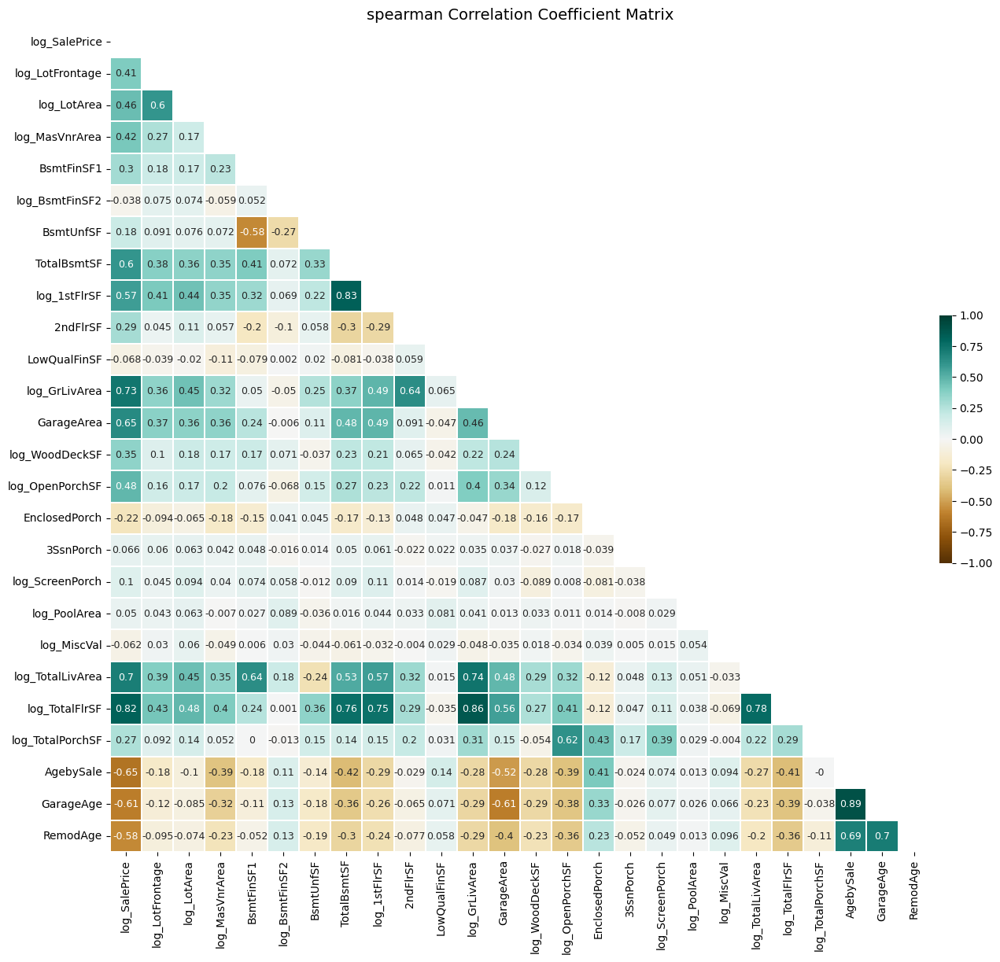

In [18]:
###### visualize spearman correlation coefficient matix ##########################################
create_corr_matrix(df=EDA_df, feat_lst = feat_type_dict_update['continuous'] + feat_type_dict_update['year'], 
                   method = 'spearman', target_var = 'log_SalePrice')

### observation and summary:
- the left-most column of two heatmap plots shows correlation coefficient between target variable and all the involved features
- some features have relatively high correlation with target variable, which will be good candidates of independent variables (features) for prediction
- some features have high correlation with each other, which can cause colinearity problem and potentially impact the model training, especially for unregularized linear regression.
- feature importance analysis can be done using regularized linear regression (Lasso and ridge regression) models


*back to [content outline](#0)*

<a name="4.1.2"></a>
## 4.1.2 continuous, discrete, and ordinal categorical variables
- spearman correlation coefficient analysis

**The ordinal features in `feat_type_dict_update['ordinal']` (except for feature `bin_OverallQual` and `bin_OverallCond`) need to be encoded to int dtype with `OrdinalEncoder()` before spearman correlation calculation, this process is done in function `create_corr_matrix` by setting required `category_dict` argument.**

,log_SalePrice,bin_BsmtFullBath,bin_BsmtHalfBath,bin_FullBath,bin_HalfBath,bin_BedroomAbvGr,bin_KitchenAbvGr,bin_TotRmsAbvGrd,bin_Fireplaces,bin_GarageCars,bin_TotalBath
log_SalePrice,1.000,0.225,-0.017,0.631,0.345,0.241,-0.169,0.531,0.518,0.691,0.704
bin_BsmtFullBath,0.225,1.000,-0.149,-0.050,-0.049,-0.107,-0.084,-0.070,0.115,0.143,0.549
bin_BsmtHalfBath,-0.017,-0.149,1.000,-0.050,-0.045,0.041,-0.010,-0.032,0.030,-0.034,-0.001
bin_FullBath,0.631,-0.050,-0.050,1.000,0.159,0.300,0.167,0.540,0.259,0.519,0.698
bin_HalfBath,0.345,-0.049,-0.045,0.159,1.000,0.284,-0.115,0.354,0.216,0.229,0.405
bin_BedroomAbvGr,0.241,-0.107,0.041,0.300,0.284,1.000,0.175,0.662,0.146,0.121,0.251
bin_KitchenAbvGr,-0.169,-0.084,-0.010,0.167,-0.115,0.175,1.000,0.216,-0.142,-0.035,0.023
bin_TotRmsAbvGrd,0.531,-0.070,-0.032,0.540,0.354,0.662,0.216,1.000,0.342,0.382,0.449
bin_Fireplaces,0.518,0.115,0.030,0.259,0.216,0.146,-0.142,0.342,1.000,0.323,0.340
bin_GarageCars,0.691,0.143,-0.034,0.519,0.229,0.121,-0.035,0.382,0.323,1.000,0.527


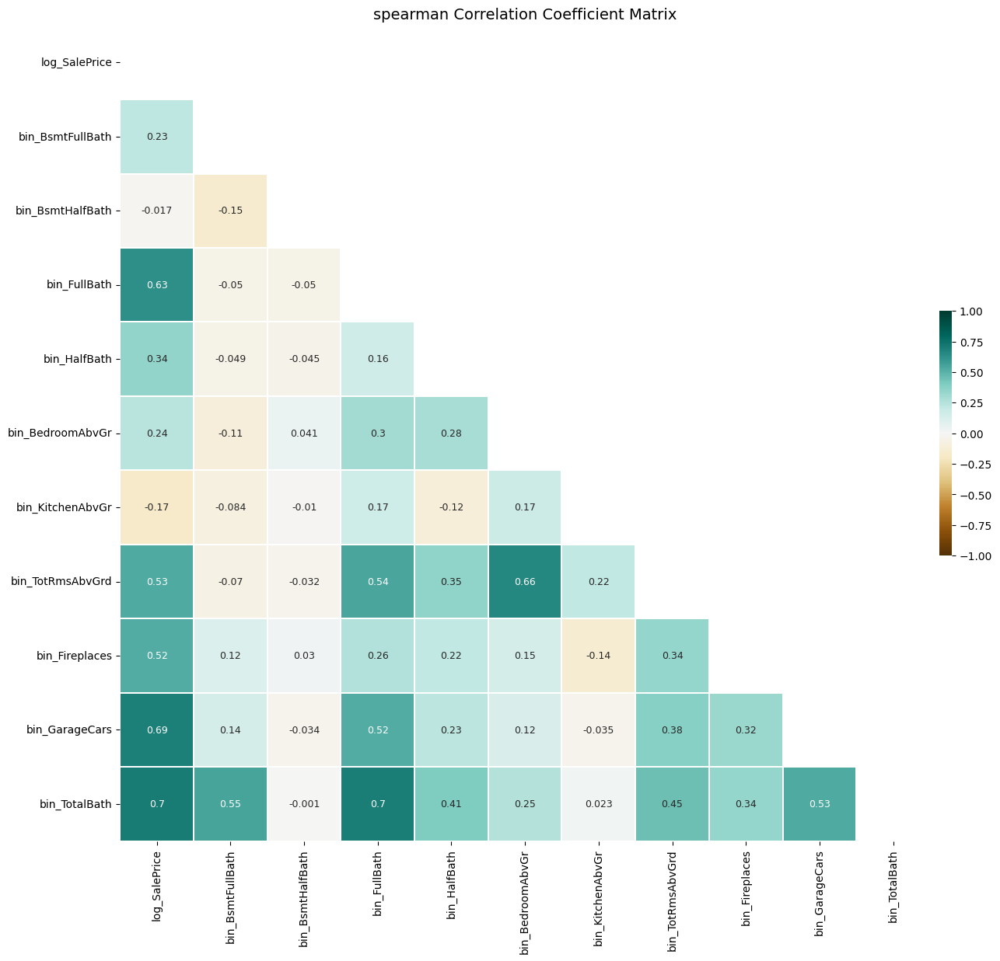

In [19]:
###### discrete features' spearman correlation coefficient matrix ###################################
create_corr_matrix(df=EDA_df, feat_lst = feat_type_dict_update['discrete'], target_var = 'log_SalePrice', 
                   method = 'spearman', category_dict = cat_map_dict_full, annot = True, cbar=True)

,log_SalePrice,ordbin_LotShape,ordbin_LandSlope,ordbin_ExterCond,ordbin_BsmtCond,ordbin_HeatingQC,ordbin_Electrical,ordbin_Functional,ordbin_GarageQual,ordbin_GarageCond,ordbin_PoolQC,ordbin_Fence,ord_ExterQual,ord_BsmtQual,ord_BsmtExposure,ord_BsmtFinType1,ord_BsmtFinType2,ord_KitchenQual,ord_FireplaceQu,ord_GarageFinish,ord_PavedDrive,bin_OverallQual,bin_OverallCond
log_SalePrice,1.000,-0.319,0.051,0.012,0.270,0.490,0.299,0.135,0.351,0.339,0.050,-0.189,0.684,0.678,0.342,0.360,0.041,0.672,0.537,0.633,0.281,0.810,-0.130
ordbin_LotShape,-0.319,1.000,-0.115,-0.027,-0.116,-0.113,-0.107,-0.027,-0.126,-0.117,-0.003,0.062,-0.189,-0.236,-0.178,-0.123,-0.062,-0.168,-0.182,-0.242,-0.117,-0.203,0.028
ordbin_LandSlope,0.051,-0.115,1.000,-0.030,0.047,-0.058,-0.013,-0.104,0.001,-0.030,-0.014,-0.032,-0.082,-0.011,0.222,0.051,0.059,-0.023,0.046,-0.027,-0.029,-0.048,0.020
ordbin_ExterCond,0.012,-0.027,-0.030,1.000,0.165,0.045,0.138,0.080,0.084,0.118,0.055,0.075,-0.007,-0.067,0.018,0.056,0.084,0.047,-0.003,-0.025,0.061,-0.016,0.328
ordbin_BsmtCond,0.270,-0.116,0.047,0.165,1.000,0.168,0.221,0.145,0.123,0.158,0.003,0.006,0.194,0.318,0.242,0.256,0.301,0.186,0.108,0.188,0.194,0.238,0.099
ordbin_HeatingQC,0.490,-0.113,-0.058,0.045,0.168,1.000,0.193,0.081,0.138,0.155,-0.068,-0.202,0.551,0.452,0.159,0.189,-0.051,0.531,0.215,0.404,0.173,0.472,-0.076
ordbin_Electrical,0.299,-0.107,-0.013,0.138,0.221,0.193,1.000,0.065,0.200,0.212,0.018,-0.002,0.238,0.280,0.171,0.211,0.092,0.252,0.139,0.253,0.236,0.247,0.051
ordbin_Functional,0.135,-0.027,-0.104,0.080,0.145,0.081,0.065,1.000,0.055,0.060,0.016,-0.072,0.117,0.155,0.088,0.123,-0.052,0.135,0.024,0.127,0.052,0.173,0.061
ordbin_GarageQual,0.351,-0.126,0.001,0.084,0.123,0.138,0.200,0.055,1.000,0.816,0.050,0.000,0.220,0.199,0.090,0.169,0.096,0.235,0.208,0.416,0.338,0.284,-0.008
ordbin_GarageCond,0.339,-0.117,-0.030,0.118,0.158,0.155,0.212,0.060,0.816,1.000,0.053,0.014,0.215,0.214,0.080,0.166,0.086,0.229,0.192,0.420,0.386,0.282,-0.002


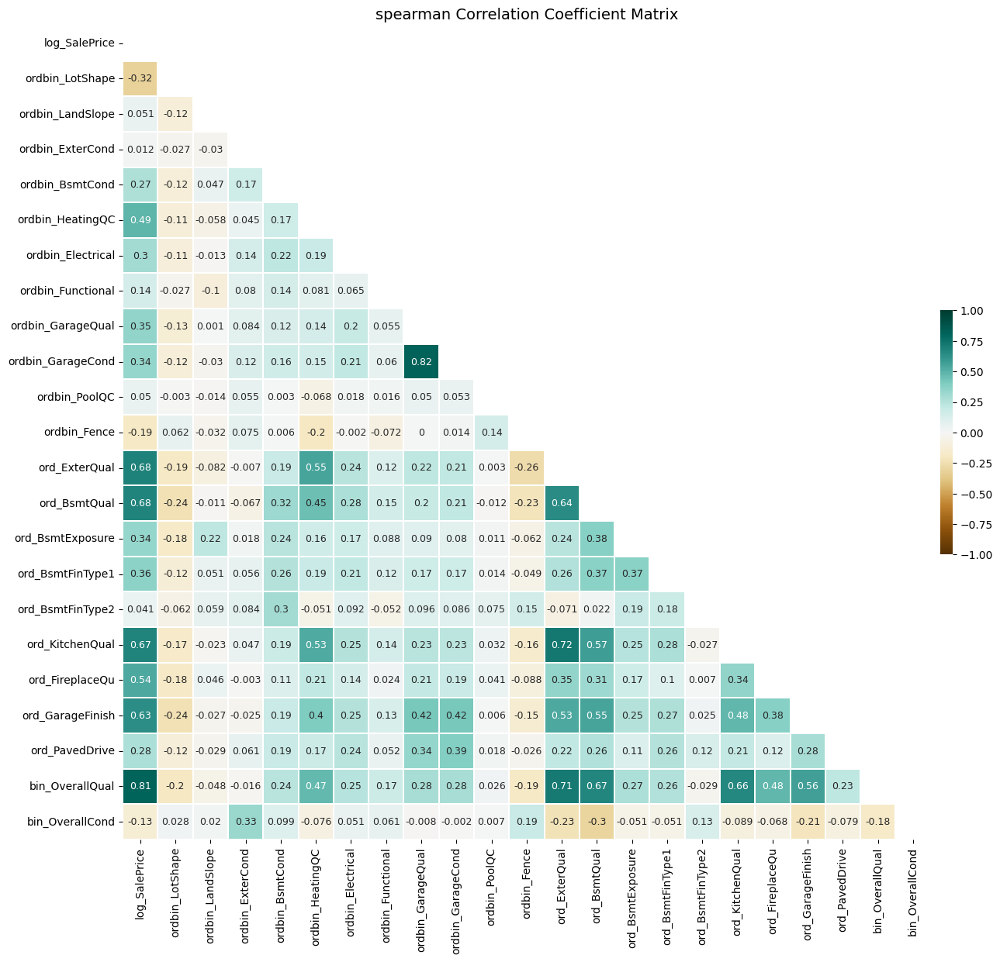

In [20]:
###### ordinal features' spearman correlation coefficient matrix ###################################
create_corr_matrix(df=EDA_df, feat_lst = feat_type_dict_update['ordinal'], target_var = 'log_SalePrice', 
                   method = 'spearman', category_dict = cat_map_dict_full, annot = True, cbar=True)


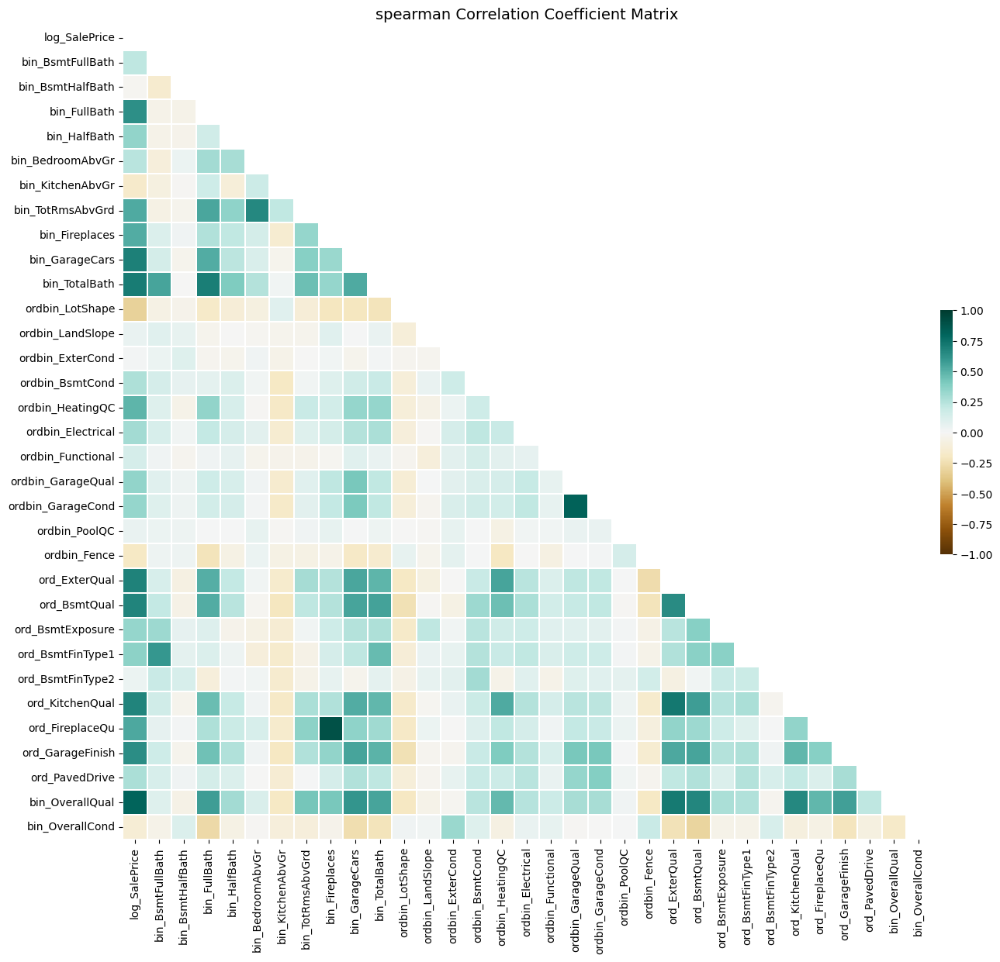

In [21]:
###### discrete + ordinal features: spearman correlation coefficient matrix ###################################
### only plot heatmap
create_corr_matrix(df=EDA_df, feat_lst = feat_type_dict_update['discrete'] + feat_type_dict_update['ordinal'],
                   target_var = 'log_SalePrice', method = 'spearman', category_dict = cat_map_dict_full, 
                   only_plot = True, annot = False, cbar=True)

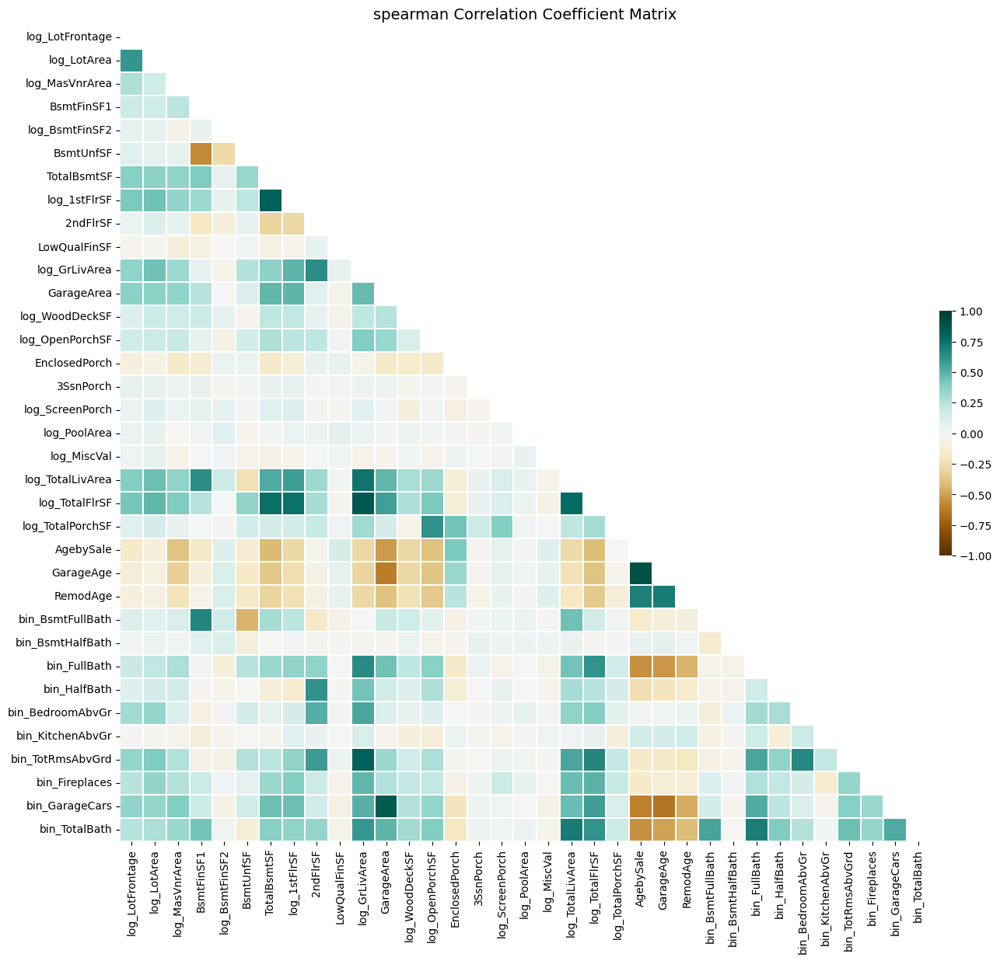

In [22]:
###### continuous + discrete features: spearman correlation coefficient matrix ###################################
### only plot heatmap
create_corr_matrix(df=EDA_df, feat_lst = feat_type_dict_update['continuous'] + feat_type_dict_update['year'] + feat_type_dict_update['discrete'], 
                   method = 'spearman', category_dict = cat_map_dict_full, 
                   only_plot = True, annot = False, cbar=True)

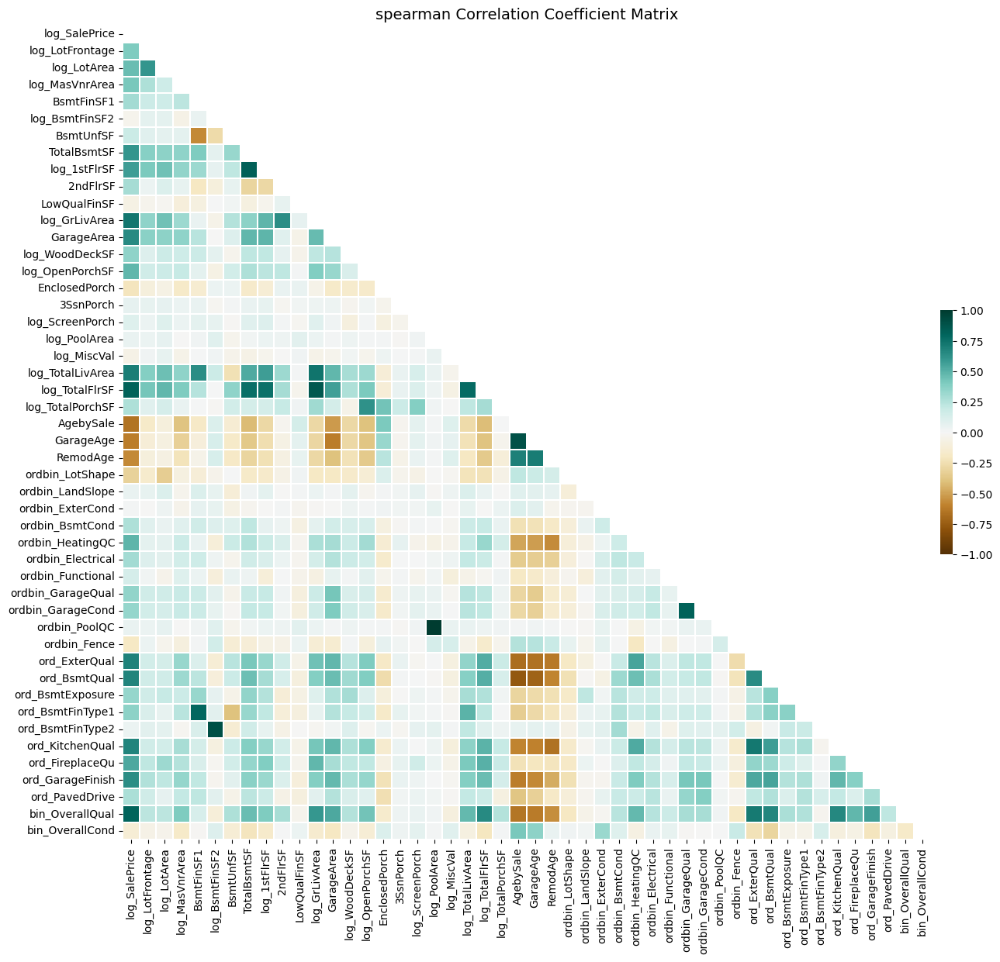

In [23]:
###### continuous + ordinal features: spearman correlation coefficient matrix ###################################
### only plot heatmap
create_corr_matrix(df=EDA_df, 
                   feat_lst = feat_type_dict_update['continuous'] + feat_type_dict_update['year'] + feat_type_dict_update['ordinal'], 
                   target_var = 'log_SalePrice', method = 'spearman', category_dict = cat_map_dict_full, 
                   only_plot = True, annot = False, cbar=True)

### observation and summary:
- similar to pearson correlation coefficient, high spearman correlations among variables show in darker blocks.
- some features have relatively high correlation with target variable, which will be good candidates of independent variables (features) for prediction
- some features have high spearman correlation with each other, which means they are highly correlated based on comparison of their ranks


*back to [content outline](#0)*

<a name="4.1.3"></a>
## 4.1.3 features highly correlated with 'log_SalePrice'

**find all features in a specific feature list that have correlation coefficients with target variable more than a threshold:**

In [33]:
###### all continuous features that have high pearson correlation (> 0.6) with 'log_SalePrice' #################
high_corr_cont_feat_lst, high_corr_df = high_corr_check(df = EDA_df, 
                                                        feat_lst = feat_type_dict_update['continuous'],
                                                        target_var = 'log_SalePrice',
                                                        corr_thresh = 0.6)
print(high_corr_cont_feat_lst)
high_corr_df

['TotalBsmtSF', 'log_1stFlrSF', 'log_GrLivArea', 'GarageArea', 'log_TotalLivArea', 'log_TotalFlrSF']


,log_SalePrice,TotalBsmtSF,log_1stFlrSF,log_GrLivArea,GarageArea,log_TotalLivArea,log_TotalFlrSF
log_SalePrice,1.000,0.642,0.611,0.733,0.655,0.743,0.815
TotalBsmtSF,0.642,1.000,0.782,0.410,0.472,0.564,0.791
log_1stFlrSF,0.611,0.782,1.000,0.531,0.474,0.603,0.741
log_GrLivArea,0.733,0.410,0.531,1.000,0.464,0.768,0.858
GarageArea,0.655,0.472,0.474,0.464,1.000,0.478,0.546
log_TotalLivArea,0.743,0.564,0.603,0.768,0.478,1.000,0.806
log_TotalFlrSF,0.815,0.791,0.741,0.858,0.546,0.806,1.000


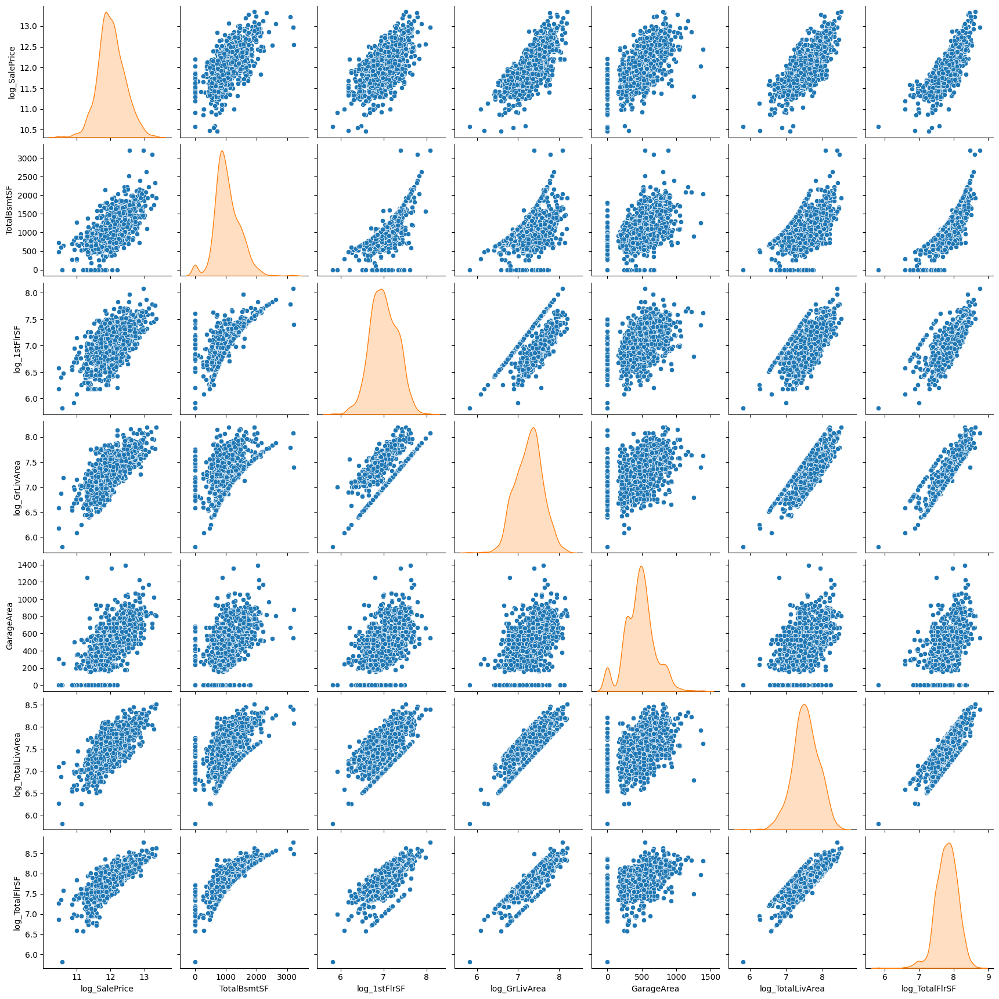

In [34]:
###### pair plot of all continuous features that have high pearson correlation with 'log_SalePrice' ########
sns.pairplot(data=EDA_df[['log_SalePrice'] + high_corr_cont_feat_lst],
             diag_kind = 'kde', diag_kws = {'color': '#ff7f0e'});

In [35]:
###### all discrete features that have high spearman correlation with 'log_SalePrice' ####################
high_corr_ord_feat_lst, high_ord_df = high_corr_check(df = EDA_df, 
                                                      feat_lst = feat_type_dict_update['discrete'], 
                                                      target_var = 'log_SalePrice',
                                                      corr_thresh = 0.6)
print(high_corr_ord_feat_lst)
high_ord_df

['bin_FullBath', 'bin_GarageCars', 'bin_TotalBath']


,log_SalePrice,bin_FullBath,bin_GarageCars,bin_TotalBath
log_SalePrice,1.000,0.631,0.691,0.704
bin_FullBath,0.631,1.000,0.519,0.698
bin_GarageCars,0.691,0.519,1.000,0.527
bin_TotalBath,0.704,0.698,0.527,1.000


In [36]:
###### all ordinal features that have high spearman correlation with 'log_SalePrice' ####################
high_corr_ord_feat_lst, high_ord_df = high_corr_check(df = EDA_df, 
                                                      feat_lst = feat_type_dict_update['ordinal'], 
                                                      target_var = 'log_SalePrice',
                                                      corr_thresh = 0.6,
                                                      category_dict = cat_map_dict_full)
print(high_corr_ord_feat_lst)
high_ord_df

['ord_ExterQual', 'ord_BsmtQual', 'ord_KitchenQual', 'ord_GarageFinish', 'bin_OverallQual']


,log_SalePrice,ord_ExterQual,ord_BsmtQual,ord_KitchenQual,ord_GarageFinish,bin_OverallQual
log_SalePrice,1.000,0.684,0.678,0.672,0.633,0.810
ord_ExterQual,0.684,1.000,0.643,0.723,0.533,0.713
ord_BsmtQual,0.678,0.643,1.000,0.571,0.553,0.670
ord_KitchenQual,0.672,0.723,0.571,1.000,0.477,0.657
ord_GarageFinish,0.633,0.533,0.553,0.477,1.000,0.565
bin_OverallQual,0.810,0.713,0.670,0.657,0.565,1.000


*back to [content outline](#0)*

<a name="4.2"></a>
## 4.2 Categorical vs. Continuous Numerical Variables
#### inferential statistics: hypothesis testing
- [4.2.1 independent t-test: compare two independent means](#4.2.1)      
  for 2-level categorical features vs. continuous variables
- [4.2.2 ANOVA: compare more than two independent means](#4.2.2)     
  for categorical featuers with more than 2 levels vs. continuous features

<a name="4.2.1"></a>
## 4.2.1 independent t-test: compare two independent means
- mainly focus on 2-level categorical features vs. target variable
  - [conditions / assumptions for performing t-test](#4.2.1.1)
  - [check skewness and normality of target variable distribution](#4.2.1.2)
  - [perform independent t-test](#4.2.1.3)
  - [find all "important" 2-level categorical features ](#4.2.1.4)
- can be applied to 2-level categorical features vs. continuous features

In [37]:
###### list of 2-level categorical features ####################################
twolev_nom_feat_lst = [feat for feat in feat_type_dict_update['nominal'] if len(EDA_df[feat].unique()) == 2]
twolev_ord_feat_lst = [feat for feat in feat_type_dict_update['ordinal'] if len(EDA_df[feat].unique()) == 2]

print('\n2-level nominal features:\n\n{}'.format(twolev_nom_feat_lst))
print('\n\n2-level ordinal features:\n\n{}'.format(twolev_ord_feat_lst))


2-level nominal features:

['Street', 'bin_Condition2', 'bin_RoofMatl', 'CentralAir', 'has_MasVnr', 'has_2ndFlr', 'has_LowQualFin', 'has_WoodDeck', 'has_OpenPorch', 'has_EnclosedPorch', 'has_3SsnPorch', 'has_ScreenPorch', 'has_Pool', 'has_Bsmt', 'has_Garage', 'ind_BsmtFinSF1', 'ind_BsmtFinSF2', 'ind_MiscVal']


2-level ordinal features:

['ordbin_LandSlope', 'ordbin_PoolQC']


<a name="4.2.1.1"></a>
#### conditions / assumptions for performing t-test
- **1. independence:**
  - within groups: sampled observations must be independent  
    - random sample/ assignment  
    - if sampling without replacement, number of observations in each group less than 10% of respective population  
  - between groups: the two groups must be independent of each other (non-paired)  
- **2. sample size/skew:**   
  the more skew in the population distributions, the higher the sample size needed

*back to [4.2.1 independent t-test](#4.2.1)*

<a name="4.2.1.2"></a>
#### check skewness and normality of target variable distribution
- before performing t-test, use kde plot, boxplot, histogram, and QQ-plot to check skewness and normality of target variable distribution in each group of a specific categorical feature

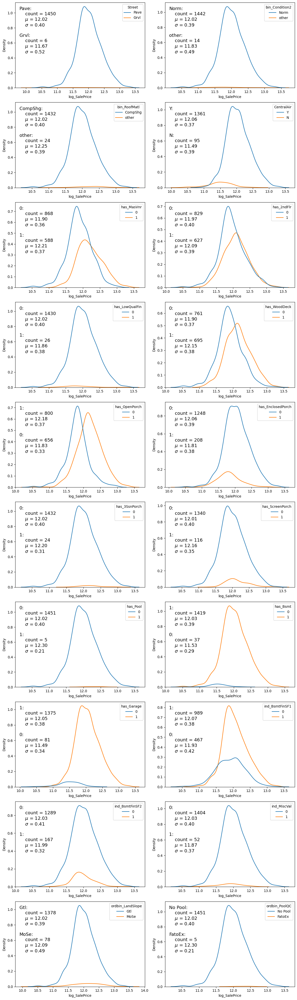

In [38]:
###### kde plot: all features vs. target ######################################################
### with information of count, mean, standard deviation for each category of the corresponding feature
plot_feat_target(df=EDA_df, feat_lst = twolev_nom_feat_lst + twolev_ord_feat_lst, target_var = 'log_SalePrice', 
                 kind = 'kde')

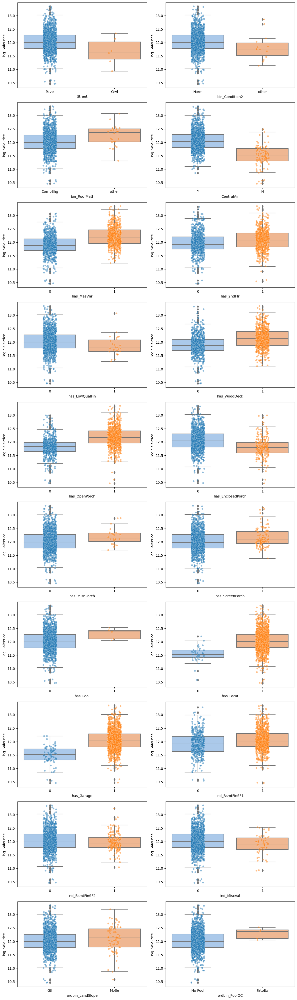

In [39]:
###### box plot and strip plot: all features vs. target ######################################################
### visually shows within group variance and difference of the mean between tow groups
plot_feat_target(df=EDA_df, feat_lst = twolev_nom_feat_lst + twolev_ord_feat_lst, target_var = 'log_SalePrice', 
                 kind = 'box_strip')

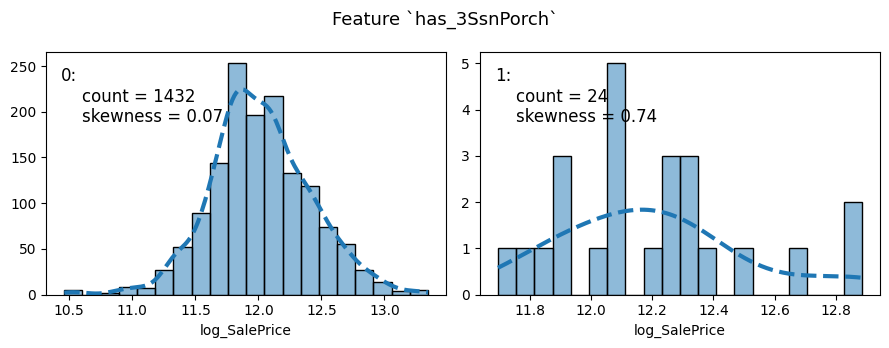

In [77]:
###### histogram: check a specific feature vs. target variable ################################
# eg. feature 'has_3SsnPorch' vs. 'log_SalePrice'
plot_onecat_feat_target(df = EDA_df, feature = 'has_3SsnPorch', target_var = 'log_SalePrice', 
                        kind = 'histogram', title_adjust = 0.85)

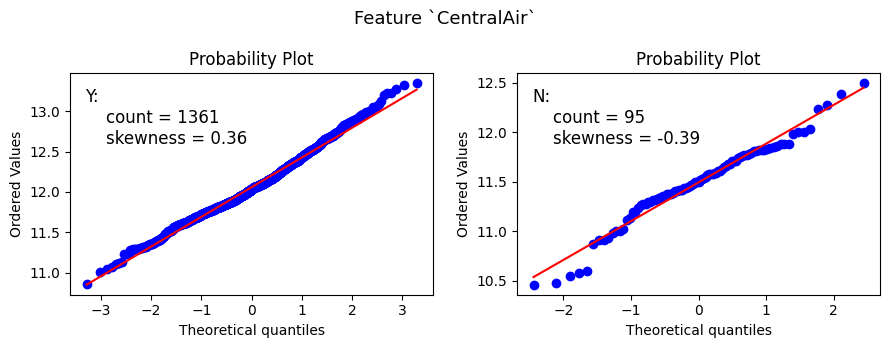

In [78]:
###### qq-plot: check a specific feature vs. target variable ################################
# eg. feature 'CentralAir' vs. 'log_SalePrice'
plot_onecat_feat_target(df = EDA_df, feature = 'CentralAir', target_var = 'log_SalePrice', 
                        kind = 'qqplot', title_adjust = 0.85)

#### observation and summary:
- for some features, number of records in each category is imbalanced, i.e., one category is the dominant one and has most records
- for most features, the skewness of target variable distribution is relatively low when the category has large record numbers
- for each feature, the boxplot roughly shows within group variance and difference of the mean between two groups


*back to [4.2.1 independent t-test](#4.2.1)*

<a name="4.2.1.3"></a>
#### perform independent t-test: 
- check if there is a statistically significant mean difference in the target variable (`log_SalePrice`) between two groups of a specific categorical feature
- use customized function `ind_t_test`

In [44]:
###### independent t-test for a 2-level categorical feature vs. log_SalePrice
ind_t_test(df=EDA_df, cat_feat='CentralAir', num_var='log_SalePrice', sig_level=0.05, 
           return_typ='summary_stats', interp = True)

Independent t-test :
Categorical Feature: CentralAir
Numerical Variable : log_SalePrice
------------------------------

(t-statistic, p_value) = (14.419, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between two groups of `CentralAir`.

The average `log_SalePrice` in group `Y` is statistically significantly
*higher* than that in group `N`.




,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Y,1361.0,12.058944,0.369182,0.010007,12.039313,12.078575
1,N,95.0,11.491858,0.390581,0.040073,11.412292,11.571423
2,combined,1456.0,12.021943,0.396080,0.010380,12.001581,12.042305


In [45]:
###### iterate through all 2-level features, only get (t-statistic, p_value) result and interpretation ###########
for feat in twolev_nom_feat_lst + twolev_ord_feat_lst:
    ind_t_test(df=EDA_df, cat_feat = feat, num_var='log_SalePrice', sig_level=0.05, return_typ=None)

Independent t-test :
Categorical Feature: Street
Numerical Variable : log_SalePrice
------------------------------

(t-statistic, p_value) = (2.200, 0.028), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between two groups of `Street`.

The average `log_SalePrice` in group `Pave` is statistically significantly
*higher* than that in group `Grvl`.


Independent t-test :
Categorical Feature: bin_Condition2
Numerical Variable : log_SalePrice
------------------------------

(t-statistic, p_value) = (1.858, 0.063), significance level = 0.05

There is *NO* statistically significant difference
in the average `log_SalePrice` between two groups of `bin_Condition2`.


Independent t-test :
Categorical Feature: bin_RoofMatl
Numerical Variable : log_SalePrice
------------------------------

(t-statistic, p_value) = (-2.873, 0.004), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_Sale

Independent t-test :
Categorical Feature: ordbin_PoolQC
Numerical Variable : log_SalePrice
------------------------------

(t-statistic, p_value) = (-1.547, 0.122), significance level = 0.05

There is *NO* statistically significant difference
in the average `log_SalePrice` between two groups of `ordbin_PoolQC`.




*back to [4.2.1 independent t-test](#4.2.1)*

<a name="4.2.1.4"></a>
#### find all "important" 2-level categorical features 
- find all 2-level categorical features that show statistically significant between-group mean difference for `log_SalePrice`

In [46]:
###### find all 2-level categorical features that show statistically significant between-group mean difference
###### for 'log_SalePrice'
twolev_diff_feat_lst, t_test_df = ind_ttest_diff_check(df = EDA_df, 
                                                       cat_feat_lst = twolev_nom_feat_lst + twolev_ord_feat_lst, 
                                                       num_var = 'log_SalePrice', 
                                                       sig_level = 0.05, all_feat = False)
print(twolev_diff_feat_lst)
t_test_df

['Street', 'bin_RoofMatl', 'CentralAir', 'has_MasVnr', 'has_2ndFlr', 'has_LowQualFin', 'has_WoodDeck', 'has_OpenPorch', 'has_EnclosedPorch', 'has_3SsnPorch', 'has_ScreenPorch', 'has_Bsmt', 'has_Garage', 'ind_BsmtFinSF1', 'ind_MiscVal']


,t_statistic,p_value
Street,2.1998,0.0280
bin_RoofMatl,-2.8727,0.0041
CentralAir,14.4195,0.0000
has_MasVnr,15.9337,0.0000
has_2ndFlr,5.6351,0.0000
has_LowQualFin,2.1710,0.0301
has_WoodDeck,-12.8091,0.0000
has_OpenPorch,19.1800,0.0000
has_EnclosedPorch,8.4592,0.0000
has_3SsnPorch,-2.2583,0.0241


*back to [4.2.1 independent t-test](#4.2.1)*

<a name="4.2.2"></a>
## 4.2.2 ANOVA: compare more than two independent means
- mainly focus on categorical featuers with more than 2 levels vs. target variable
  - [conditions / assumptions for performing ANOVA](#4.2.2.1)
  - [check skewness and normality of target variable distribution](#4.2.2.2)
  - [perform ANOVA to compare more than 2 independent means](#4.2.2.3)

- can be applied to multi-level (>2) categorical features vs. continuous features

In [47]:
###### list of multi-level (>2) categorical features ####################################
multilev_nom_feat_lst = [feat for feat in feat_type_dict_update['nominal'] if len(EDA_df[feat].unique()) > 2]
multilev_ord_feat_lst = [feat for feat in feat_type_dict_update['ordinal'] if len(EDA_df[feat].unique()) > 2]

print('\n{} multi-level nominal features:\n\n{}'.format(len(multilev_nom_feat_lst), multilev_nom_feat_lst))
print('\n\n{} multi-level ordinal features:\n\n{}'.format(len(multilev_ord_feat_lst), multilev_ord_feat_lst))


19 multi-level nominal features:

['bin_MSSubClass', 'MSZoning', 'Alley', 'LandContour', 'LotConfig', 'bin_Neighborhood', 'bin_Condition1', 'BldgType', 'bin_HouseStyle', 'bin_RoofStyle', 'bin_Exterior1st', 'bin_Exterior2nd', 'MasVnrType', 'bin_Foundation', 'bin_Heating', 'bin_GarageType', 'bin_MiscFeature', 'bin_SaleType', 'bin_SaleCondition']


20 multi-level ordinal features:

['ordbin_LotShape', 'ordbin_ExterCond', 'ordbin_BsmtCond', 'ordbin_HeatingQC', 'ordbin_Electrical', 'ordbin_Functional', 'ordbin_GarageQual', 'ordbin_GarageCond', 'ordbin_Fence', 'ord_ExterQual', 'ord_BsmtQual', 'ord_BsmtExposure', 'ord_BsmtFinType1', 'ord_BsmtFinType2', 'ord_KitchenQual', 'ord_FireplaceQu', 'ord_GarageFinish', 'ord_PavedDrive', 'bin_OverallQual', 'bin_OverallCond']


<a name="4.2.2.1"></a>
#### conditions / assumptions for performing ANOVA

- **1. independence:**      
  the observations should be independent within and across groups
  - within group: sampled observations must be independent of each other:  
    - random sample/ assignment  
    - number of observations in each group less than 10% of respective population
  - between/across group: groups must be independent of each other
- **2. the data (corresponding numerical variable) within each group are nearly normal**
  - especially important when sample sizes are small
  - can visually check using probability plot (QQ-plot)
- **3. homoscedasticity or Homogeneity of variances:**      
   the variability across the groups is consistent (about equal): constant variance
  - homoscedastic groups are especially important when sample sizes differ between groups
  - can visually check using side-by-side boxplot and summary statistic table


*back to [4.2.2 ANOVA](#4.2.2)*

<a name="4.2.2.2"></a>
#### check skewness and normality of target variable distribution
- before performing ANOVA, check conditions /assumptions for ANOVA:  
  - use kde plot, boxplot, histogram, and QQ-plot to check skewness and normality of target variable distribution  
     in each group of a specific categorical feature  
  - boxplot / box_strip plot aims to compare within-group variance and check cross-group mean difference

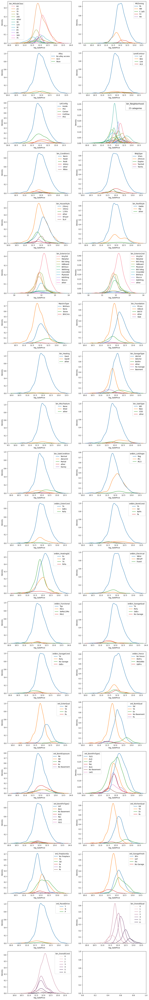

In [48]:
###### kde plot: all features vs. target ######################################################
plot_feat_target(df=EDA_df, feat_lst = multilev_nom_feat_lst + multilev_ord_feat_lst, target_var = 'log_SalePrice', 
                 kind = 'kde')

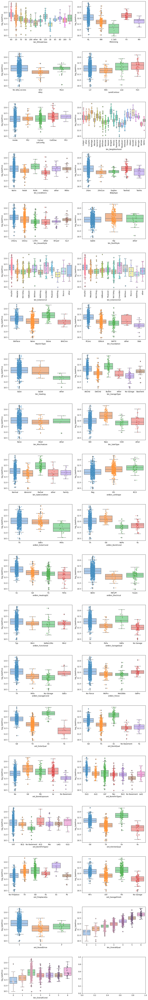

In [49]:
###### box plot and strip plot: all features vs. target ######################################################
### visually shows within group variance and difference of the mean among groups
plot_feat_target(df=EDA_df, feat_lst = multilev_nom_feat_lst + multilev_ord_feat_lst, target_var = 'log_SalePrice', 
                 kind = 'box_strip', x_rotate_feat=['bin_Neighborhood', 'bin_Exterior1st', 'bin_Exterior2nd'])

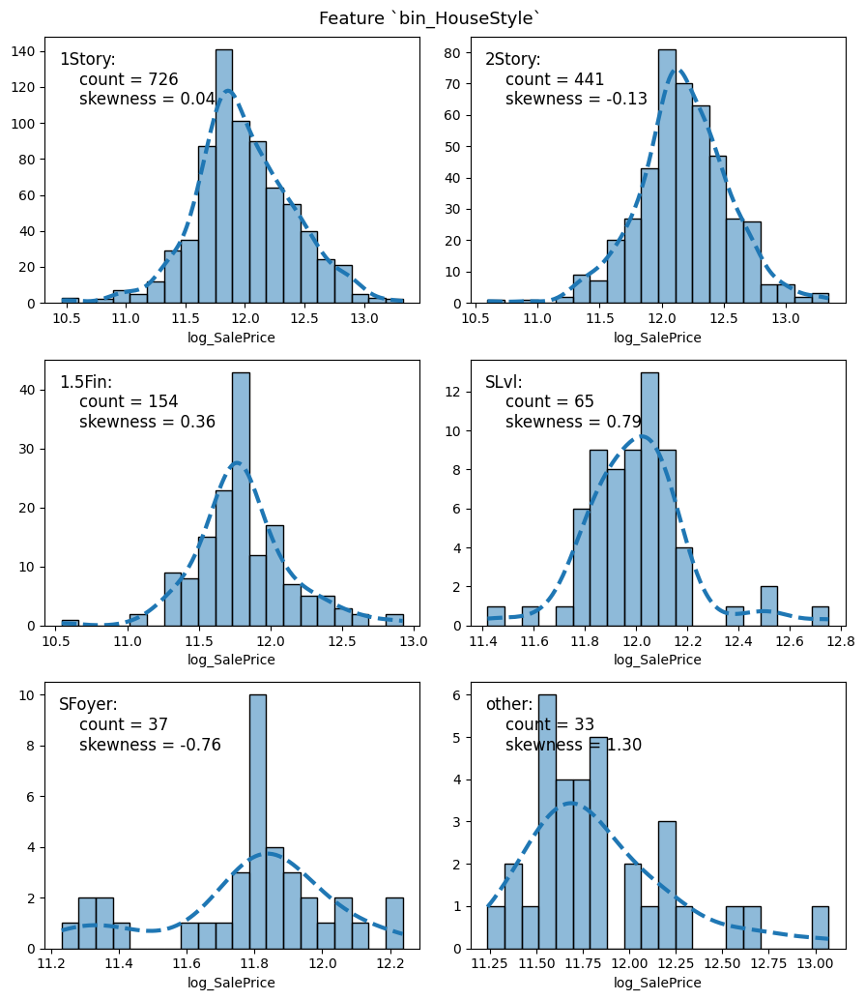

In [79]:
###### histogram: check a specific feature vs. target variable ################################
# especially features with large number of categories
# eg. feature 'bin_HouseStyle' vs. 'log_SalePrice'
plot_onecat_feat_target(df = EDA_df, feature = 'bin_HouseStyle', target_var = 'log_SalePrice', 
                        kind = 'histogram', title_adjust = 0.95)

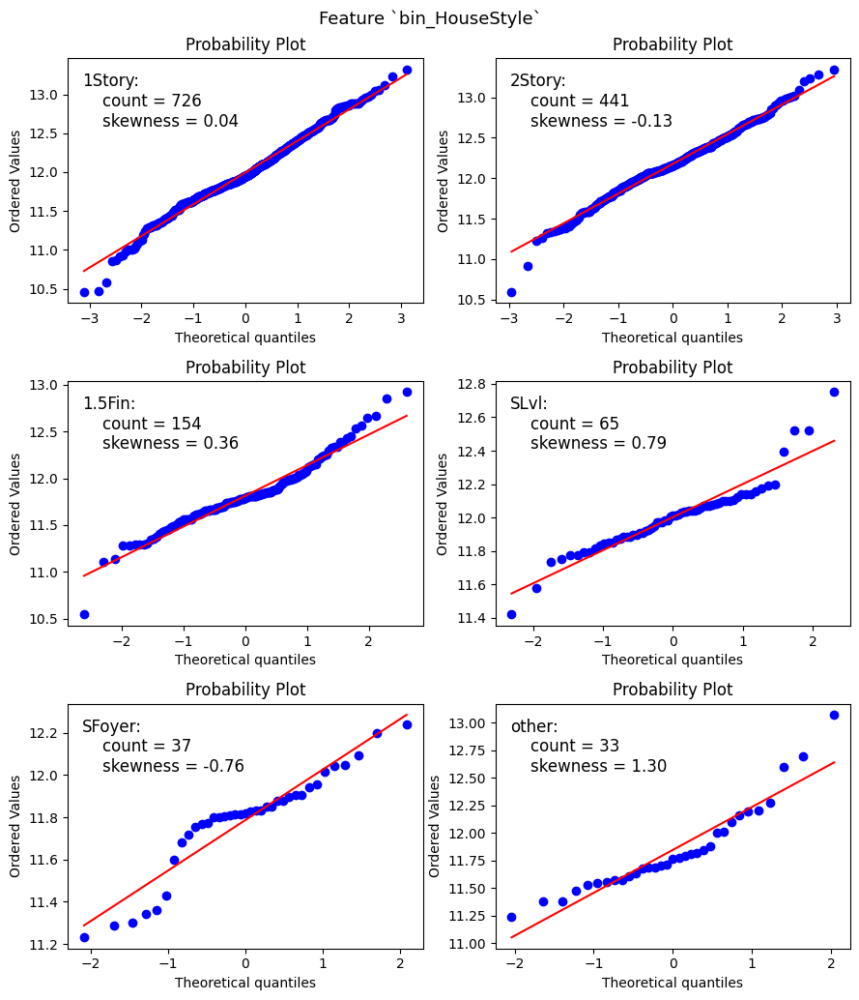

In [80]:
###### qq-plot: check a specific feature vs. target variable ################################
# eg. feature 'bin_HouseStyle' vs. 'log_SalePrice'
plot_onecat_feat_target(df = EDA_df, feature = 'bin_HouseStyle', target_var = 'log_SalePrice', 
                        kind = 'qqplot', title_adjust = 0.9)

#### observation and summary:
- kde plots cannot show the density of all groups obviously
- for some features, number of records in each category is imbalanced, i.e., some categories are dominant ones and have most records
- for most features, the skewness of target variable distribution is relatively low when the category has large record numbers
- for each feature, the boxplot roughly shows within group variance and difference of the mean among groups


*back to [4.2.2 ANOVA](#4.2.2)*

<a name="4.2.2.3"></a>
#### perform ANOVA to compare more than 2 independent means:
- check if there is a statistically significant mean difference in the target variable (`log_SalePrice`) among groups of a specific categorical feature
- use customized function `anova_test`

In [81]:
###### ANOVA for a multi-level categorical feature vs. log_SalePrice ######################################
### return ANOVA test result
anova_test(df=EDA_df, cat_feat='LotConfig', num_var='log_SalePrice', sig_level=0.05, 
           return_typ = 'aov_table', interp = True)

ANOVA:
Categorical Feature: LotConfig
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (8.865, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between groups of `LotConfig`:

Among all groups of `LotConfig`, at least one pair of
`log_SalePrice` means are different from each other.




,sum_sq,df,F,PR(>F)
C(LotConfig),5.445431,4.0,8.865383,4.517026e-07
Residual,222.813869,1451.0,NaN,NaN


In [82]:
###### ANOVA for a multi-level categorical feature vs. log_SalePrice ######################################
### return ols regression result
anova_test(df=EDA_df, cat_feat='bin_GarageType', num_var='log_SalePrice', sig_level=0.05, 
           return_typ = 'ols_reg_result', interp = True)

ANOVA:
Categorical Feature: bin_GarageType
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (147.204, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between groups of `bin_GarageType`:

Among all groups of `bin_GarageType`, at least one pair of
`log_SalePrice` means are different from each other.




<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.337
Model:                            OLS   Adj. R-squared:                  0.334
Method:                 Least Squares   F-statistic:                     147.2
Date:                Mon, 14 Nov 2022   Prob (F-statistic):          1.60e-126
Time:                        09:16:28   Log-Likelihood:                -418.16
No. Observations:                1456   AIC:                             848.3
Df Residuals:                    1450   BIC:                             880.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         12.1578      0.011   1107.843      0.000      12.136      12.179
C(bin_GarageType)[T.Basment]      -0.2414      0.075     -3.221      0.001      -0.388      -0.094
C(bin_GarageType)[T.BuiltIn]       0.2199      0.036      6.052      0.000       0.149       0.291
C(bin_GarageType)[T.Detchd]       -0.3922      0.020    -19.853      0.000      -0.431      -0.353
C(bin_GarageType)[T.No Garage]    -0.6660      0.038    -17.738      0.000      -0.740      -0.592
C(bin_GarageType)[T.other]        -0.4454      0.084     -5.292      0.000      -0.610      -0.280
==============================================================================
Omnibus:                       30.301   Durbin-Watson:                   1.945
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               52.269
Skew:                           0.149   Prob(JB):                     4.47e-12
Kurtosis:                       3.879   Cond. No.                         10.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [83]:
###### ANOVA for a multi-level categorical feature vs. log_SalePrice ######################################
### return summary statistics
anova_test(df=EDA_df, cat_feat='bin_HouseStyle', num_var='log_SalePrice', sig_level=0.05, 
           return_typ = 'summary_stats', interp = True)

ANOVA:
Categorical Feature: bin_HouseStyle
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (29.392, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between groups of `bin_HouseStyle`:

Among all groups of `bin_HouseStyle`, at least one pair of
`log_SalePrice` means are different from each other.








,N,Mean,SD,SE,95% Conf.,Interval
1.5Fin,154,11.8135,0.3322,0.0268,11.7606,11.8664
1Story,726,11.9937,0.4087,0.0152,11.9639,12.0235
2Story,441,12.1772,0.3675,0.0175,12.1428,12.2116
SFoyer,37,11.7865,0.243,0.0399,11.7055,11.8675
SLvl,65,12.0022,0.2042,0.0253,11.9516,12.0527
other,33,11.8449,0.3973,0.0692,11.7041,11.9858
Overall,1456.0,12.0219,0.3961,0.0104,12.0016,12.0423


In [84]:
###### loop through all multi-level features, only get (t-statistic, p_value) result and interpretation ###########
for feat in multilev_nom_feat_lst + multilev_ord_feat_lst:
    anova_test(df=EDA_df, cat_feat=feat, num_var='log_SalePrice', sig_level=0.05, return_typ = None)

ANOVA:
Categorical Feature: bin_MSSubClass
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (58.759, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between groups of `bin_MSSubClass`:

Among all groups of `bin_MSSubClass`, at least one pair of
`log_SalePrice` means are different from each other.


ANOVA:
Categorical Feature: MSZoning
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (78.414, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between groups of `MSZoning`:

Among all groups of `MSZoning`, at least one pair of
`log_SalePrice` means are different from each other.


ANOVA:
Categorical Feature: Alley
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (20.793, 0.000), significance level = 0.05

There *EXISTS* a s

ANOVA:
Categorical Feature: ord_KitchenQual
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (390.680, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between groups of `ord_KitchenQual`:

Among all groups of `ord_KitchenQual`, at least one pair of
`log_SalePrice` means are different from each other.


ANOVA:
Categorical Feature: ord_FireplaceQu
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (129.583, 0.000), significance level = 0.05

There *EXISTS* a statistically significant difference
in the average `log_SalePrice` between groups of `ord_FireplaceQu`:

Among all groups of `ord_FireplaceQu`, at least one pair of
`log_SalePrice` means are different from each other.


ANOVA:
Categorical Feature: ord_GarageFinish
Numerical Variable : log_SalePrice
------------------------------

(F-statistic, p_value) = (299.417, 0.000), signifi

#### observation and summary:
- ANOVA for all multi-level features with `log_SalePrice` show significant sitatistical difference.
- can further perform multi-level categorical features vs. continuous numerical features


*back to [4.2.2 ANOVA](#4.2.2)*   
*back to [content outline](#0)*

<a name="4.3"></a>
## 4.3 Categorical vs. Categorical Variables
#### inferential statistics: hypothesis testing
- [4.3.1 independence test between 2-level categorical features](#4.3.1)   
  two independent proportion z-test / Fisher’s Exact test:   
  evaluate the relationship between two categorical variables, both of which are 2-level
- [4.3.2 chi-square test of independence](#4.3.2)   
  evaluate the relationship between two categorical variables (at least one with more than 2 levels)  

<a name="4.3.1"></a>
## 4.3.1 independence test between 2-level categorical features
- [conditions / assumptions for performing two independent proportion z-test](#4.3.1.1)
- [independence test between 2-level categorical features](#4.3.1.2)    
  evaluate the relationship between two categorical variables, both of which are 2-level:   
  - two independent proportion z-test  
  - Fisher’s Exact test

In [85]:
###### 2-level categorical feature list ####################################
print(twolev_nom_feat_lst)
print(twolev_ord_feat_lst)

['Street', 'bin_Condition2', 'bin_RoofMatl', 'CentralAir', 'has_MasVnr', 'has_2ndFlr', 'has_LowQualFin', 'has_WoodDeck', 'has_OpenPorch', 'has_EnclosedPorch', 'has_3SsnPorch', 'has_ScreenPorch', 'has_Pool', 'has_Bsmt', 'has_Garage', 'ind_BsmtFinSF1', 'ind_BsmtFinSF2', 'ind_MiscVal']
['ordbin_LandSlope', 'ordbin_PoolQC']


<a name="4.3.1.1"></a>
#### conditions / assumptions for performing two independent proportion z-test
- **1. independence:**
  - within groups: sampled observations must be independent  
    - random sample/ assignment  
    - if sampling without replacement, number of observations in each group less than 10% of respective population  
  - between groups: the two groups must be independent of each other (non-paired)  
- **2. sample size/skew:**    
  each sample should meet the success-failure condition:
  - number of successes / failures in each group must be at least 10,    
    i.e. each particular scenario (cell) must have at least 10 cases


<a name="4.3.1.2"></a>
#### independence test between 2-level categorical features
- use customized function `cat2lev_ind_test`

In [86]:
###### independence test between 2-level categorical features ######################################
### return Fisher’s Exact test result
cat2lev_ind_test(df=EDA_df, feat_1='has_MasVnr', feat_2='has_WoodDeck', sig_level=0.05, 
                 return_typ = 'fisher_test_res', interp = True)

Independence test between 2-level categorical features:
Feature 1: has_MasVnr
Feature 2: has_WoodDeck
------------------------------

Test Result Summary:
--------------------

                     test_statistic      p_value  cal_function             module
-------------------  ----------------  ---------  -----------------------  ----------------------------
z-test               5.9162                    0  proportions_ztest()      statsmodels.stats.proportion
Chi-square test      35.0018                   0  proportions_chisquare()  statsmodels.stats.proportion
Fisher’s Exact test                            0  crosstab()               researchpy
----------------------------------------------------------------------------------------------------

z-test assumption check:
According to crosstab (contingency table), the sample size condition for
two independent proportion z-test is *SATISFIED*:
*ALL* cells have at least 10 cases.

According to p_value from z-test result, There *EXISTS* 

,Fisher's exact test,results
0,Odds ratio =,1.8904
1,2 sided p-value =,0.0000
2,Left tail p-value =,1.0000
3,Right tail p-value =,0.0000
4,Cramer's phi =,0.1550


In [87]:
###### independence test between 2-level categorical features ######################################
### return crosstabulation/contingency table for cell counts
cat2lev_ind_test(df=EDA_df, feat_1='has_MasVnr', feat_2='CentralAir', sig_level=0.05, 
                 return_typ = 'crosstab', interp = True)

Independence test between 2-level categorical features:
Feature 1: has_MasVnr
Feature 2: CentralAir
------------------------------

Test Result Summary:
--------------------

                     test_statistic      p_value  cal_function             module
-------------------  ----------------  ---------  -----------------------  ----------------------------
z-test               6.9998                    0  proportions_ztest()      statsmodels.stats.proportion
Chi-square test      48.9967                   0  proportions_chisquare()  statsmodels.stats.proportion
Fisher’s Exact test                            0  crosstab()               researchpy
----------------------------------------------------------------------------------------------------

z-test assumption check:
According to crosstab (contingency table), the sample size condition for
two independent proportion z-test is *NOT SATISFIED*:
*NOT ALL* cells have at least 10 cases.

According to p_value from z-test result, There *EX

CentralAir            
CentralAir          N     Y   All
has_MasVnr                       
0                  89   779   868
1                   6   582   588
All                95  1361  1456

In [88]:
###### independence test between 2-level categorical features ######################################
### return result summary data frame of all tests
cat2lev_ind_test(df=EDA_df, feat_1='has_2ndFlr', feat_2='CentralAir', sig_level=0.05, 
                 return_typ = 'res_sum', interp = True)

Independence test between 2-level categorical features:
Feature 1: has_2ndFlr
Feature 2: CentralAir
------------------------------

Test Result Summary:
--------------------

                     test_statistic      p_value  cal_function             module
-------------------  ----------------  ---------  -----------------------  ----------------------------
z-test               -1.5194              0.1287  proportions_ztest()      statsmodels.stats.proportion
Chi-square test      2.3087               0.1287  proportions_chisquare()  statsmodels.stats.proportion
Fisher’s Exact test                       0.1346  crosstab()               researchpy
----------------------------------------------------------------------------------------------------

z-test assumption check:
According to crosstab (contingency table), the sample size condition for
two independent proportion z-test is *SATISFIED*:
*ALL* cells have at least 10 cases.

According to p_value from z-test result, There is *NO* rel

,test_statistic,p_value,cal_function,module
z-test,-1.519444,0.128651,proportions_ztest(),statsmodels.stats.proportion
Chi-square test,2.308710,0.128651,proportions_chisquare(),statsmodels.stats.proportion
Fisher’s Exact test,NaN,0.134600,crosstab(),researchpy


#### function `cat2lev_ind_test()` has more return value options (by setting `return_typ` argument), check as needed


*back to [4.3 Categorical vs. Categorical Variables](#4.3)*

<a name="4.3.2"></a>
## 4.3.2 Chi-square test of independence
- [conditions / assumptions for performing Chi-square test](#4.3.2.1)
- [Chi-square test of independence between multi-level categorical features](#4.3.2.2)   
  evaluate the relationship between two categorical variables (at least one with more than 2 levels)  

In [89]:
###### multi-level categorical feature list ####################################
print(multilev_nom_feat_lst)
print(multilev_ord_feat_lst)

['bin_MSSubClass', 'MSZoning', 'Alley', 'LandContour', 'LotConfig', 'bin_Neighborhood', 'bin_Condition1', 'BldgType', 'bin_HouseStyle', 'bin_RoofStyle', 'bin_Exterior1st', 'bin_Exterior2nd', 'MasVnrType', 'bin_Foundation', 'bin_Heating', 'bin_GarageType', 'bin_MiscFeature', 'bin_SaleType', 'bin_SaleCondition']
['ordbin_LotShape', 'ordbin_ExterCond', 'ordbin_BsmtCond', 'ordbin_HeatingQC', 'ordbin_Electrical', 'ordbin_Functional', 'ordbin_GarageQual', 'ordbin_GarageCond', 'ordbin_Fence', 'ord_ExterQual', 'ord_BsmtQual', 'ord_BsmtExposure', 'ord_BsmtFinType1', 'ord_BsmtFinType2', 'ord_KitchenQual', 'ord_FireplaceQu', 'ord_GarageFinish', 'ord_PavedDrive', 'bin_OverallQual', 'bin_OverallCond']


<a name="4.3.2.1"></a>
#### conditions / assumptions for performing Chi-square test
- **1. independence:** sampled observations must be independent
  - random sample/ assignment
  - if sampling without replacement, number of observations less than 10% of population
  - each case only contributes to one cell in the contingency table  
- **2. sample size:**   
  - each particular scenario (i.e. cell) must have at least 5 **expected** cases


<a name="4.3.2.2"></a>
#### Chi-square test of independence between multi-level categorical features
- use customized function `chi2_test`

In [90]:
###### Chi-square test of independence between multi-level categorical features #####################
### return test result data frame
chi2_test(df=EDA_df, feat_1='has_MasVnr', feat_2='bin_HouseStyle', sig_level=0.05, 
          return_typ = 'test_res', interp = True)

Chi-square independence test between multi-level categorical features:
Feature 1: has_MasVnr
Feature 2: bin_HouseStyle
------------------------------

(Chi-square statistic, p_value, degree_freedom) = (106.044, 0.000, 5),
significance level = 0.05

Chi-square test assumption check:
According to expected cell counts table, the sample size condition for
Chi-square test is *SATISFIED*:
*ALL* cells have at least 5 *expected* cases.

According to p_value from test result, There *EXISTS* a relationship between
`has_MasVnr` and `bin_HouseStyle` distribution with significance level 0.05.

The two categorical features are *DEPENDENT* of each other.



,Chi-square test,results
0,Pearson Chi-square ( 5.0) =,106.0440
1,p-value =,0.0000
2,Cramer's V =,0.2699


In [91]:
###### Chi-square test of independence between multi-level categorical features #####################
### return crosstabulation/contingency table for cell counts
chi2_test(df=EDA_df, feat_1='bin_OverallQual', feat_2='bin_HouseStyle', sig_level=0.05, 
          return_typ = 'crosstab', interp = True)

Chi-square independence test between multi-level categorical features:
Feature 1: bin_OverallQual
Feature 2: bin_HouseStyle
------------------------------

(Chi-square statistic, p_value, degree_freedom) = (246.066, 0.000, 30),
significance level = 0.05

Chi-square test assumption check:
According to expected cell counts table, the sample size condition for
Chi-square test is *NOT SATISFIED*:
*NOT ALL* cells have at least 5 *expected* cases.

According to p_value from test result, There *EXISTS* a relationship between
`bin_OverallQual` and `bin_HouseStyle` distribution with significance level 0.05.

The two categorical features are *DEPENDENT* of each other.



bin_HouseStyle                                      
bin_HouseStyle          1.5Fin 1Story 2Story SFoyer SLvl other   All
bin_OverallQual                                                     
0                            4     19      2      0    0     0    25
1                           20     71     14      7    2     2   116
2                           64    246     43     16   18    10   397
3                           47    145    132      9   30    11   374
4                           14    120    159      5   13     8   319
5                            5     89     72      0    2     0   168
6                            0     36     19      0    0     2    57
All                        154    726    441     37   65    33  1456

In [92]:
###### Chi-square test of independence between multi-level categorical features #####################
### return expected cell counts table
chi2_test(df=EDA_df, feat_1='bin_OverallQual', feat_2='bin_Neighborhood', sig_level=0.05, 
          return_typ = 'exp_count_tab', interp = True)

Chi-square independence test between multi-level categorical features:
Feature 1: bin_OverallQual
Feature 2: bin_Neighborhood
------------------------------

(Chi-square statistic, p_value, degree_freedom) = (1498.279, 0.000, 132),
significance level = 0.05

Chi-square test assumption check:
According to expected cell counts table, the sample size condition for
Chi-square test is *NOT SATISFIED*:
*NOT ALL* cells have at least 5 *expected* cases.

According to p_value from test result, There *EXISTS* a relationship between
`bin_OverallQual` and `bin_Neighborhood` distribution with significance level 0.05.

The two categorical features are *DEPENDENT* of each other.



bin_Neighborhood                                            \
bin_Neighborhood          Blmngtn    BrDale    BrkSide   ClearCr    CollgCr   
bin_OverallQual                                                               
0                        0.291896  0.274725   0.995879  0.480769   2.575549   
1                        1.354396  1.274725   4.620879  2.230769  11.950549   
2                        4.635302  4.362637  15.814560  7.634615  40.899725   
3                        4.366758  4.109890  14.898352  7.192308  38.530220   
4                        3.724588  3.505495  12.707418  6.134615  32.864011   
5                        1.961538  1.846154   6.692308  3.230769  17.307692   
6                        0.665522  0.626374   2.270604  1.096154   5.872253   

                                                                        \
bin_Neighborhood    Crawfor    Edwards    Gilbert     IDOTRR   MeadowV   
bin_OverallQual                                                          
0                  0.875687   1.682692   1.356456   0.635302  0.291896   
1                  4.063187   7.807692   6.293956   2.947802  1.354396   
2                 13.905907  26.721154  21.540522  10.088599  4.635302   
3                 13.100275  25.173077  20.292582   9.504121  4.366758   
4                 11.173764  21.471154  17.308379   8.106456  3.724588   
5                  5.884615  11.307692   9.115385   4.269231  1.961538   
6                  1.996566   3.836538   3.092720   1.448489  0.665522   

                                                                         \
bin_Neighborhood    Mitchel      NAmes     NWAmes    NoRidge    NridgHt   
bin_OverallQual                                                           
0                  0.841346   3.863324   1.253434   0.669643   1.322115   
1                  3.903846  17.925824   5.815934   3.107143   6.134615   
2                 13.360577  61.349588  19.904533  10.633929  20.995192   
3                 12.586538  57.795330  18.751374  10.017857  19.778846   
4                 10.735577  49.296016  15.993819   8.544643  16.870192   
5                  5.653846  25.961538   8.423077   4.500000   8.884615   
6                  1.918269   8.808379   2.857830   1.526786   3.014423   

                                                                        \
bin_Neighborhood    OldTown     SWISU     Sawyer    SawyerW    Somerst   
bin_OverallQual                                                          
0                  1.940247  0.429258   1.270604   1.013049   1.476648   
1                  9.002747  1.991758   5.895604   4.700549   6.851648   
2                 30.811126  6.816621  20.177198  16.087225  23.449176   
3                 29.026099  6.421703  19.008242  15.155220  22.090659   
4                 24.757555  5.477335  16.212912  12.926511  18.842033   
5                 13.038462  2.884615   8.538462   6.807692   9.923077   
6                  4.423764  0.978709   2.896978   2.309753   3.366758   

                                                 
bin_Neighborhood   StoneBr     Timber     other  
bin_OverallQual                                  
0                 0.429258   0.652473  0.377747  
1                 1.991758   3.027473  1.752747  
2                 6.816621  10.361264  5.998626  
3                 6.421703   9.760989  5.651099  
4                 5.477335   8.325549  4.820055  
5                 2.884615   4.384615  2.538462  
6                 0.978709   1.487637  0.861264

*back to [4.3.2 Chi-square test of independence](#4.3.2)*   
*back to [content outline](#0)*

<a name="5"></a>
## EDA Part 2 summary
- performed variable correlation/dependency analysis
- visualized variable relationship with multiple types of plots
- performed statistical inference with hypothesis testing
- interpreted the results clearly with each hypothesis testing
#### this part of EDA can act as a comprehensive reference for upcomming feature importance analysis phase